# Modelos lineales y generalizaciones {#sec-linear-models}


In [4]:
#| code-fold: true

import arviz as az
import bambi as bmb
import kulprit as kpt
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import preliz as pz
import pymc as pm
from scipy.interpolate import PchipInterpolator
from scipy.stats import linregress
import xarray as xr

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [2]:
#| code-fold: true

plt.style.use('arviz-doc')

La música, ya sea la Suite para violonchelo N° 1 de Bach, _arrancármelo_ de Wos o Libertango de Piazzolla, se construye con patrones recurrentes. Las mismas escalas, progressiones de acordes, riffs, etc. aparecen una y otra vez dando lugar a un maravilloso paisaje sonoro capaz de provocar y modular toda la gama de emociones humanas. De manera similar, el universo estadístico está compuesto de patrones recurrentes, pequeños motivos que aparecen una y otra vez. En este capítulo, vamos a ver uno de los más populares y útiles, el modelo lineal. Este es un modelo muy útil en sí mismo y también el componente básico de muchos otros modelos. Es probable que algunos de los siguientes términos te resulten familiares: regresión lineal simple, regresión múltiple, regresión logística, ANOVA, ANCOVA. Todos estos métodos son variaciones del mismo motivo subyacente, el modelo de regresión lineal. En este capítulo, cubriremos los siguientes temas:

* Repaso sobre regresión lineal
* Modelos lineales generalizados
* Regresión jerárquica 
* Regresión polinómica y splines
* Interacciones
* Predictores categóricos
* Modelos distribucionales
* Cómo usar Bambi para construir y analizar modelos
* Selección de variables

Supongamos que tenemos una variable $X$, y a partir de esta queremos predecir o modelar una variable $Y$. Además, estás variables se encuentran apareadas $\{(x_1,y_1), (x_2,y_2), \dots (x_n,y_n)\}$.
En el caso más simple $X$ e $Y$ son variables aleatorias continuas y unidimensionales, usando un lenguaje de programación, como Python, las representaríamos usando _arrays_ de dimensión 1 y de tipo flotante. 

Las variable $Y$ suele recibir distintos nombres como variable dependiente, predicha o respuesta, mientras que $X$ recibe nombres como variable independiente, predictora o _de entrada_. En _Machine learning_ es común hablar de _features_ en vez de variables y es común pensar que una regresión lineal es un ejemplo de [aprendizaje supervisado](https://es.wikipedia.org/wiki/Aprendizaje_supervisado).



Algunas situaciones típicas en las que se pueden utilizar modelos de regresión lineal:

* Modelar la relación entre la salinidad del suelo y la productividad de los cultivos. Luego, responder preguntas como: ¿Es la relación lineal? ¿Qué tan fuerte es esta relación?

* Encontrar una relación entre el consumo promedio de chocolate por país y el número de premios Nobel en ese país, y luego comprender por qué esta relación es probablemente espuria.

* Predecir la factura de gas de una casa utilizando la radiación solar del informe meteorológico local. ¿Qué tan precisa es esta predicción?

## La idea central en regresión lineal

Anteriormente vimos el modelo normal, que (omitiendo las distribuciones a priori) definimos como:

$$
Y \sim \mathcal{N}(\mu, \sigma)
$$

La idea central de la regresión lineal es extender este modelo, agregando una variable predictora $X$ a la estimación de la media $\mu$:

$$
\begin{aligned}
\mu &= \alpha + \beta X  \\
Y &\sim \mathcal{N}(\mu, \sigma)
\end{aligned}
$$

Este modelo dice que existe una relación lineal entre la variable $X$ y la variable $Y$. Pero esta relación solo es válida en promedio, por lo que agregamos un término de error o ruido $\sigma$. Además, el modelo dice que la media de $Y$ es una función lineal de $X$, con **intercepto** $\alpha$ y **pendiente** $\beta$. El intercepto nos dice el valor de $Y$ cuando $X=0$, la pendiente nos dice el cambio en $Y$ por unidad de cambio en $X$. Debido a que no conocemos los valores de $\alpha$, $\beta$ o $\sigma$, debemos determinar una distribución a priori para estos parámetros.

Una suposición típica cuando se establecen priors para modelos lineales es suponer que son independientes. Esta suposición simplifica enormemente la elección de priors, ya que en vez de definir una distribución conjunta para los 3 parámetros, podemos definir 3 distribuciones por separado. Al menos en principio, $\alpha$ y $\beta$ pueden tomar cualquier valor en los reales, por lo que es común usar a prioris normales para ellos. En cambio $\sigma$ debe ser un número positivo, por lo que es común usar distribuciónes como seminormal, exponencial, gamma-inversa, etc.

Los valores que puede tomar el intercepto pueden variar mucho de un problema a otro. Por ejemplo, yo solía trabajar con problemas donde era esperable que $\alpha$ estuviera alrededor de cero y con una desviación estándar muy por debajo de 1. Pero esta experiencia (casi anecdótica) es dificil de trasladar a cualquier otro problema. Con respecto a la pendiente ($\beta$), puede ser más fácil tener una noción informada. Usualmente tenemos una idea del signo de la pendiente, por ejemplo esperamos que el peso de un animal aumente, en promedio, con la variable largo (o altura). Para $\sigma$, podemos establecerlo en un valor grande en la escala de la variable $Y$, por ejemplo, 2 veces el valor de su desviación estándar. Debemos tener cuidado al usar los datos observados para estimar a prioris, por lo general, está bien si los datos se usan para evitar el uso de a prioris muy restrictivos. Si no tenemos demasiado conocimiento del parámetro, tiene sentido asegurarse que la distribución a priori sea realmente vaga. En cambio, si queremos definir distribuciones a priori más informativas, entonces no deberíamos obtener esa información de los datos observados, sino que deberíamos obtenerla de nuestro conocimiento del dominio.

## Bicicletas lineales

Ahora que tenemos una idea general de cómo luce un modelo lineal Bayesiano, tratemos de cimentar esta idea con un ejemplo.

Vamos a empezar muy sencillo, tenemos un registro de temperaturas y del número de bicicletas alquiladas en una ciudad. Queremos modelar la relación entre la temperatura y el número de bicicletas alquiladas. Usaremos [bike-sharing dataset](https://archive.ics.uci.edu/ml/datasets/bike+sharing+dataset) del repositorio [UCI Machine Learning Repository](https://archive.ics.uci.edu/datasets). El conjunto de datos original contiene 17379 registros, cada registro tiene 17 variables, pero para este ejemplo usaremos tan solo 348 registros y dos variables `temperatura` y `alquiladas`. La variable 'temperatura' es la temperatura en Celsius y 'alquiladas' es el número de bicicletas alquiladas. 

Carguemos los datos y grafiquémoslos

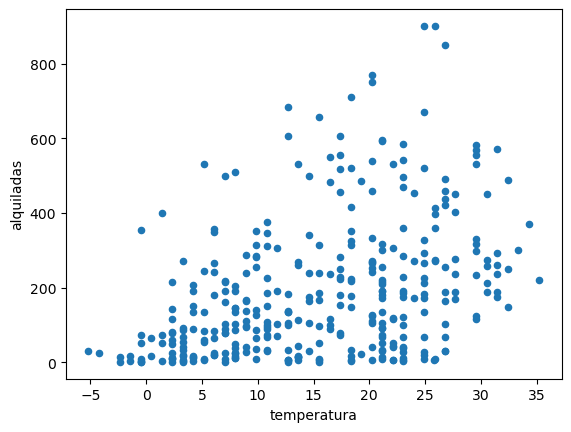

In [5]:
bicis = pd.read_csv("datos/bicis.csv")

bicis.plot(x="temperatura", y="alquiladas", kind="scatter");

Construyamos un modelo lineal bayesiano para estos datos. La temperatura será nuestra variable independiente (nuestra "X") y el número de bicicletas alquiladas será nuestra variable dependiente (nuestra "Y"). Vamos a utilizar el siguiente modelo:

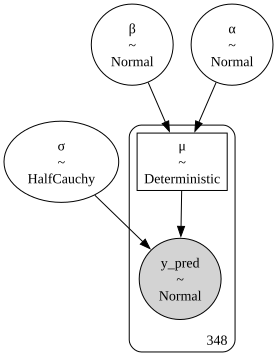

In [6]:
with pm.Model() as modelo_bl:
    α = pm.Normal('α', mu=0, sigma=100)
    β = pm.Normal('β', mu=0, sigma=10)
    σ = pm.HalfCauchy('σ', 10)
    μ = pm.Deterministic('μ', α + β * bicis.temperatura)
    _ = pm.Normal('y_pred', mu=μ, sigma=σ, observed=bicis.alquiladas)

pm.model_to_graphviz(modelo_bl)

Antes de calcular la distribución a posteriori tomemos un momento para leer el código línea por línea y asegurarnos de entender lo que está pasando. Comparemos el código con la representación visual del modelo.

Como ya dijimos, este modelo es similar a un modelo normal, la diferenciea principal es que la media se modela como una función lineal de la temperatura. El intercepto es $\alpha$ y la pendiente es $\beta$. El término de ruido es $\sigma$ y la media es $\mu$. 

Algo importante a notar es que la variable $\mu$ es una variable determinista (`pm.Deterministic`). Le llamamos así ya que una vez conocidos los valores de $\alpha$ y $\beta$, el valor de $\mu$ queda determinado. En vez que `μ = pm.Deterministic('μ', α + β * bikes.temperatura)` podríamos haber escrito `μ = α + β * bicicletas.temperatura` o incluso `_ = pm.Normal('y_pred', mu=α + β * bicicletas.temperatura, sigma=ϵ, observado=bicicletas.alquiladas)` y el modelo sería el mismo. La única razón de usar `pm.Deterministic`, es que de esta forma le pedimos a PyMC que guarde los valores de $\mu$ en el InferenceData.

In [7]:
with modelo_bl:
    idata_bl = pm.sample(random_seed=123)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [α, β, σ]


Output()

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 33 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Veamos un trace plot de `idata_bl` combinando todas las cadenas en una sola curva

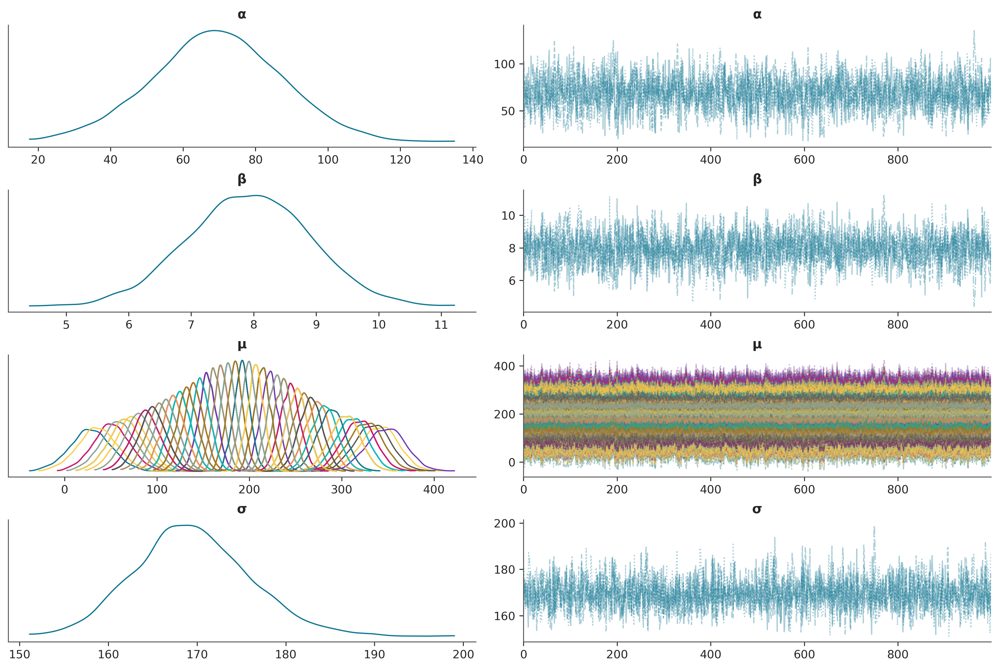

In [6]:
az.plot_trace(idata_bl, combined=True);  

Algo que suele resultar confuso o inesperado para muchos estudiantes es la gráfica para $\mu$, por qué hay tantas curvas? Porque a cada observaciones le corresponde una curva, para cáda valor de $X$, hacemos 

$$
\mu_i = \alpha + \beta + x_i
$$

Es decir un valor de $\mu$ por cada valor de $X$, además como $\alpha$ y $\beta$ son distribuciones. Entonces cada $\mu_i$ es también una distribución. 

Podemos comprobar que hay 348 distribuciones para $\mu$ inspeccionado el InfereceData, por ejemplo:

In [7]:
cadenas, muestras, mus = idata_bl.posterior["μ"].shape
f"{cadenas=}, {muestras=}, {mus=}"

'cadenas=4, muestras=1000, mus=348'

### Interpretando la media a posteriori

Habiendo aclarado este punto vamos a focalizarnos en intepretar los parámetros del modelo, pero omitiendo `μ`. Hagamos un gráfico de las distribuciones a posteriori marginales para $\alpha$, $\beta$ y $\sigma$,  

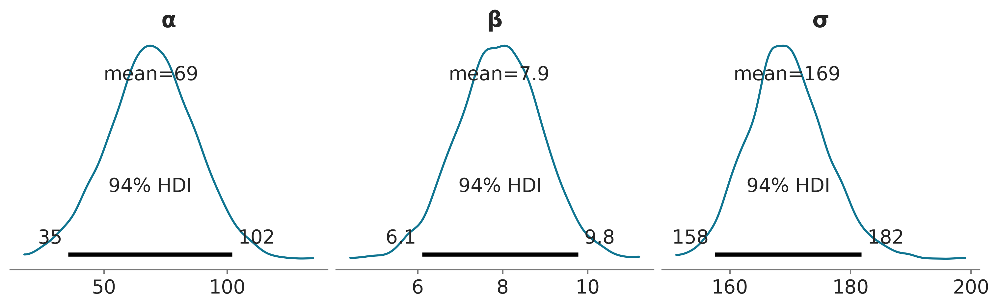

In [8]:
az.plot_posterior(idata_bl, var_names=['~μ'], figsize=(10, 3));

Si solo leemos las medias de cada distribución podemos decir que $\mu = 69 + 7,9 X$. Con esta información podemos decir que el valor esperado de bicicletas alquiladas cuando la temperatura es 0 es de 69 y por cada grado de temperatura el número de bicicletas alquiladas aumenta en 7,9. Así que para una temperatura de 28 grados esperamos alquilar $69 + 7.9 * 28 \approx 278$ bicicletas. Este es nuestro valor esperado, pero la distribución a posteriori también nos informa sobre la incertidumbre en torno a esta estimación. Por ejemplo, el HDI 94% para $\beta$ es (6,1, 9,7), por lo que por cada grado de temperatura el número de bicicletas alquiladas podría aumentar de 6 a unas 10.

Incluso si omitimos la incertidumbre a posteriori, y solo prestaramos atención a las medias, tenemos incertidumbre sobre el número de bicicletas alquiladas debido al valor de $\sigma$ de 170. Entonces, si decimos que para una temperatura de 28 grados, esperamos alquilar 278 bicicletas, no debería sorprendernos que el número real resulte estar entre $\approx 100$ y $\approx 500$ bicicletas.

Ahora vamos a crear algunas gráficas que nos ayudarán a visualizar la incertidumbre combinada de estos parámetros. En una primer lectura recomiendo saltearse el código y focalizarse en las figuras y su interpretación.

La siguiente figura tiene dos paneles. Ambos muestran del número medio de bicicletas alquiladas en función de la temperatura. La diferencia está en como se representa la incertidumbre. Para el panel izquierdo, tomamos 50 muestras de la distribución a posteriori de $\mu$ y las dibujamos como líneas individuales. Para el panel derecho tomamos todas las muestras a posteriori de $\mu$ y las usamos para calcular el HDI 94%.


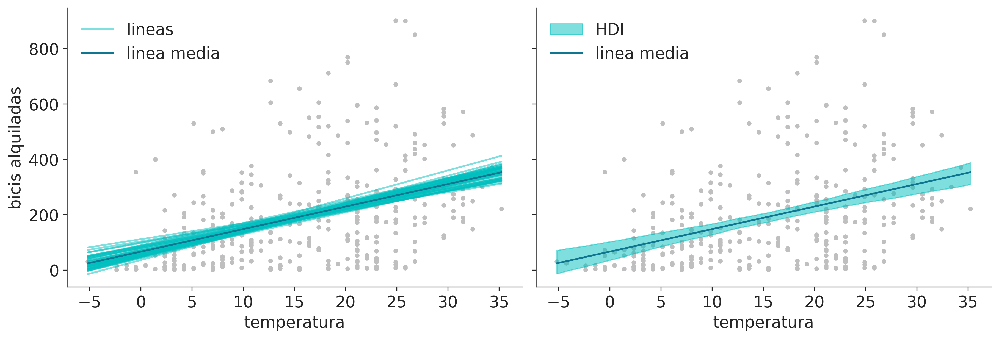

In [9]:
posterior = az.extract(idata_bl, num_samples=50)
x_plot = xr.DataArray(np.linspace(bicis.temperatura.min(), bicis.temperatura.max(), 50), dims="plot_id")
linea_media = posterior['α'].mean() + posterior['β'].mean() * x_plot
lineas = posterior['α'] + posterior['β'] * x_plot
hdi_lines = az.hdi(idata_bl.posterior['μ'])


fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
axes[0].plot(bicis.temperatura, bicis.alquiladas,  '.', color="0.75",  zorder=-3)
lines_ = axes[0].plot(x_plot, lineas.T, c='C1', alpha=0.5, label='lineas')
plt.setp(lines_[1:], label="_")
axes[0].plot(x_plot, linea_media, c='C0', label='linea media')
axes[0].set_xlabel('temperatura')
axes[0].set_ylabel('bicis alquiladas')
axes[0].legend()

axes[1].plot(bicis.temperatura, bicis.alquiladas, '.', color="0.75",  zorder=-3)
idx = np.argsort(bicis.temperatura.values)
axes[1].fill_between(bicis.temperatura[idx], hdi_lines["μ"][:,0][idx], hdi_lines["μ"][:,1][idx],
                     color="C1", label='HDI', alpha=0.5)
axes[1].plot(x_plot, linea_media, c='C0', label='linea media')
axes[1].set_xlabel('temperatura')
axes[1].legend();

Ambos paneles transmiten esencialmente la misma información, si volvemos a correr el código para generar el gráfico, las lineas serán diferentes, porque las 50 muestras serán distintas cada vez (salvo que fijemos una semilla). Sin embargo, el área sombreada será la misma, porque estamos utilizando todas las muestras ya calculadas. Si reajustamos el modelo (sin fijar una semillar), no solo obtendremos líneas diferentes, sino que el área sombreada también podría cambiar, pero la diferencia debería ser muy pequeña, caso contrario es probable que necesitemos más muestras (incrementar la candidad de `draws` en `pm.sample(.)`)

OK, pero ¿Por qué mostramos dos gráficos ligeramente diferentes si transmiten la misma información? Bueno, por un lado para resaltar que hay diferentes formas de representar la incertidumbre. ¿Cuál es mejor? Como de costumbre, eso depende del contexto, el área sombreada es una buena opción, es muy común y es simple de calcular e interpretar. Pero pueden darse situaciones donde nos interese mostrar muestras individuales de la distribución a posteriori, por ejemplo, la mayoría de las líneas podrían abarcar una determinada región, pero algunas podrían tener una pendiente muy alta. Un área sombreada podría opacar esta información. Al mostrar muestras individuales, puede ser una buena idea animarlas si las está mostrando en una presentación o en un video (ver [Hypothetical Outcome Plots](http://users.eecs.northwestern.edu/~jhullman/hops_jobs_pfs.pdf) para obtener más información al respecto).

Otra razón para mostrar estas figuras es que vean diferentes formas de extraer información de la distribución a posteriori. Si prestamos atención al código veremos que en la primera línea usamos `az.extract` toma la dimensión `chain` y `draw` y las apila en una sola dimensión `sample`, que puede ser útil para el procesamiento posterior. Además, usamos el argumento `num_samples` para solicitar una submuestra de la distribución a posteriori. Por defecto `az.extract` opera sobre el grupo `posterior` de un InferenceData. Si deseamos extraer información de otro grupo, podemos usar el argumento `group`. En la segunda línea, definimos un DataArray llamado `x_plot`, con valores igualmente espaciados empezando por la temperatura mínima observada y terminado en la máxima observada. La razón para crear un DataArray es poder usar las capacidades de alineación automática de Xarray (esto lo hacemos en las próximas dos líneas). Si usaramos un arreglo NumPy necesitariamos agregar dimensiones adicionales, lo que puede resultar confuso, la mejor manera de entender completamente lo que quiero decir es definir `x_plot = np.linspace(bikes.temperature.min(), bikes.temperature.max())` e intentar rehacer el gráfico. En la tercer y cuarta línea de código, calculamos la media del posterior de $\mu$ para cada valor de `x_plot` las líneas individuales, respectivamente. Podríamos haber usado `posterior['μ']`, pero en su lugar reescribimos explícitamente el modelo lineal, lo hacemos para ser explícitos y con la esperanza de que te ayude a obtener más intuición sobre los modelos lineales.

### Interpretando las predicciones a posteriori

¿Qué pasa si no solo estamos interesados en el valor esperado (promedio), sino que queremos pensar en términos de predicciones, es decir, en términos de bicicletas alquiladas? Bueno, para eso podemos usar la distribución predictiva a posteriori. Después de ejecutar la siguiente línea de código `idata_lb` contendrá un nuevo grupo `posterior_predictive` con una variable `y_pred` que representa la distribución predictiva a posteriori para el número de bicicletas alquiladas.

In [9]:
pm.sample_posterior_predictive(idata_bl, model=modelo_bl, extend_inferencedata=True, random_seed=123)

Sampling: [y_pred]


Output()

Inference data with groups:
	> posterior
	> posterior_predictive
	> sample_stats
	> observed_data

En la siguiente figura la línea azul es la media del número de bicicletas alquiladas, esto es lo mismo que ya vimos en la figura anterior. Los nuevos elementos son la banda turquesa oscuro, que representa el 50% central (cuartiles 0,25 y 0,5) para las bicicletas alquiladas y la banda turquesa claro, que representa el 94% central (cuartiles 0,03 y 0,97).

Podemos notar que nuestro modelo predice un número negativo de bicicletas, lo cual no tiene sentido para nuestro problema, ya que no estemas modelando robo o pérdida de bicicletas. Pero detengamonos un momento a reflexionar sobre nuestro modelo. Tiene sentido, según el modelo, que tengamos valores negativos de bicicletas? 

Si, esto debería esperarse ya que usamos una distribución Normal como likelihood en `modelo_bl`. Una *solución* muy sucia podría ser recortar las predicciones para valores inferiores a cero, pero eso es feo, feo. En la siguiente sección, veremos que podemos mejorar fácilmente este modelo para evitar predicciones sin sentido.


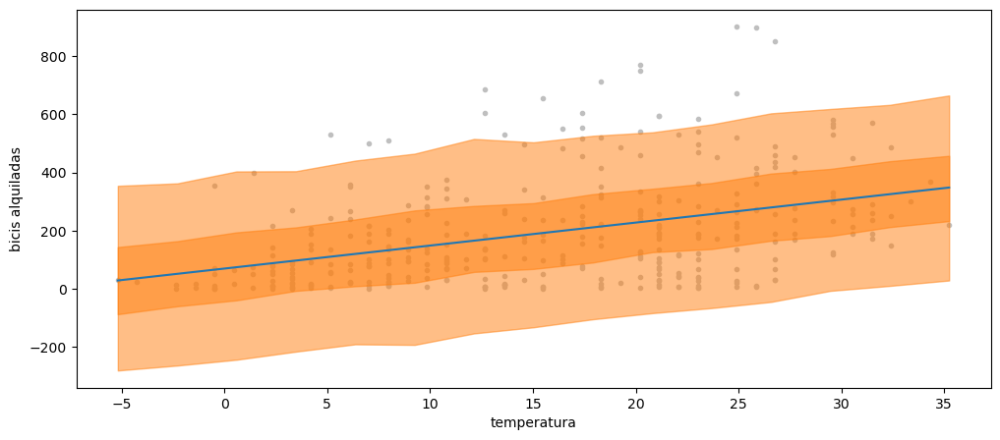

In [10]:
linea_media = idata_bl.posterior['μ'].mean(("chain", "draw"))
idx = np.argsort(bicis.temperatura.values)
x = np.linspace(bicis.temperatura.min(), bicis.temperatura.max(), 15)
y_pred_q = idata_bl.posterior_predictive['y_pred'].quantile([0.03, 0.97, 0.25, 0.75], dim=['chain', 'draw'])
y_hat_bounds = iter([PchipInterpolator(bicis.temperatura.values[idx], y_pred_q[i][idx])(x) for i in range(4)])

_, ax = plt.subplots(figsize=(12, 5))
ax.plot(bicis.temperatura, bicis.alquiladas, '.', color="0.75",  zorder=-3)
ax.plot(bicis.temperatura[idx], linea_media[idx], c='C0')

for lb, ub in zip(y_hat_bounds, y_hat_bounds): 
    ax.fill_between(x,
                    lb, ub,
                    color="C1", alpha=0.5)


ax.set_xlabel('temperatura')
ax.set_ylabel('bicis alquiladas');

## Generalizando el modelo lineal

El modelo lineal que hemos estado usando es un caso especial de un modelo más general, el modelo lineal generalizado (GLM, por su sigla en inglés). El GLM es una generalización del modelo lineal que nos permite utilizar diferentes distribuciones para el likelihood. De forma general (y omitiendo priors), podemos escribir un GLM como:



$$
\begin{aligned}
\mu &= \alpha + \beta X \\
Y &\sim \phi(f(\mu), \theta)
\end{aligned}
$$


donde $\phi$ es una distribución arbitraria algunos casos comunes son Normal, Student's T, Gamma, NegativeBinomial, pero podemos usar otras. $\theta$ representa cualquier parámetro *auxiliar* o *ruido* que pueda tener la distribución, por ejemplo $\sigma$ para la distribución Normal. También tenemos $f$, generalmente llamada función de enlace inverso. Cuando $\phi$ es Normal, entonces $f$ es la función identidad. Para distribuciones como Gamma y NegativeBinomial, $f$ suele ser la función exponencial. ¿Por qué necesitamos $f$? Porque $\mu$ generalmente tomará valores en los reales, para una distribución como la Normal esto es correcto ya que la media está definida en los reales, pero esto no es necesariamente así para otras distribuciones. Por ejemplo, el parámetro $\mu$ de la Negativa Binomial se define solo para números positivos, por lo que necesitamos una transformación que nos lleve de los reales a los positivos. La función exponencial es un buen candidato para esta transformación. Vamos a explorar varios GLM, un buen ejercicio es crear una tabla y cada vez que veamos una un nuevo GLM, agregar una línea que indique qué es $\phi$, $\theta$, $f$ y tal vez algunas notas sobre cuándo se usa este GLM. Bien, comencemos con nuestro primer ejemplo concreto de un GLM.

## Generalizando el modelo lineal para datos de conteo

¿Cómo podemos cambiar `modelo_bl` para acomodar mejor los datos de las bicicletas? Hay dos cosas a tener en cuenta, el número de bicicletas alquiladas es discreto y está acotado en cero. Esto generalmente se conoce como datos de conteo. Se les llama así porque son el resultado de contar algo. Los datos de conteo a veces se modelan usando una distribución continua como una Normal, especialmente cuando el número de conteos es grande. Pero a menudo es una buena idea usar una distribución discreta. Dos opciones comunes son la distribución de Poisson y el NegativaBinomial. La principal diferencia es que, para la distribución de Poisson, la media y la varianza son iguales y están controladas por un mismo parámetro. Asumir que la media y la varianza son idénticas puede no ser adecuado. En esos casos es común tomar como alternativa la distribución NegativaBinomial, ya que permite que la media y la varianza sean diferentes. Ante la duda es posible generar dos modelos y evaluar si una Poisson o una NegativaBinomial es más adecuada. Más adelante veremos algunos criterios para comparar modelos, por ahora vamos a usar la distribución NegativaBinomial.

El modelo de PyMC es muy similar al anterior, pero con dos diferencias principales. Primero, usamos `pm.NegativeBinomial` en lugar de `pm.Normal` para el likelihood. La distribución NegativaBinomial tiene dos parámetros, la media $\mu$ y un parámetro de dispersión $\alpha$. La varianza de la NegativaBinomial es $\mu + \frac{\mu^2}{\alpha}$. Entonces, cuanto mayor sea el valor de $\alpha$, mayor será la varianza. La segunda diferencia es que $\mu$ es `pm.math.exp(α + β * bikes.temperatura)` en lugar de solo `α + β * bikes.temperatura`, como ya explicamos, esto es necesario para transformar los realaes a valores positivos.

In [12]:
with pm.Model() as modelo_neg:
    α = pm.Normal('α', mu=0, sigma=100)
    β = pm.Normal('β', mu=0, sigma=10)
    σ = pm.HalfCauchy('σ', 10)
    μ = pm.Deterministic('μ', pm.math.exp(α + β * bicis.temperatura))
    y_pred = pm.NegativeBinomial('y_pred', mu=μ, alpha=σ, observed=bicis.alquiladas)
    idata_neg = pm.sample(random_seed=123)
    idata_neg.extend(pm.sample_posterior_predictive(idata_neg, random_seed=123))

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [α, β, σ]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.
Sampling: [y_pred]


Output()

La distribución predictiva a posteriori para `modelo_neg` se muestra en la siguiente figura. Podemos ver que ya no predecimos valores negativos y que la varianza de las predicciones aumenta con la media. Esto es de esperar ya que la varianza de la NegativaBinomial es $\mu + \frac{\mu^2}{\alpha}$.

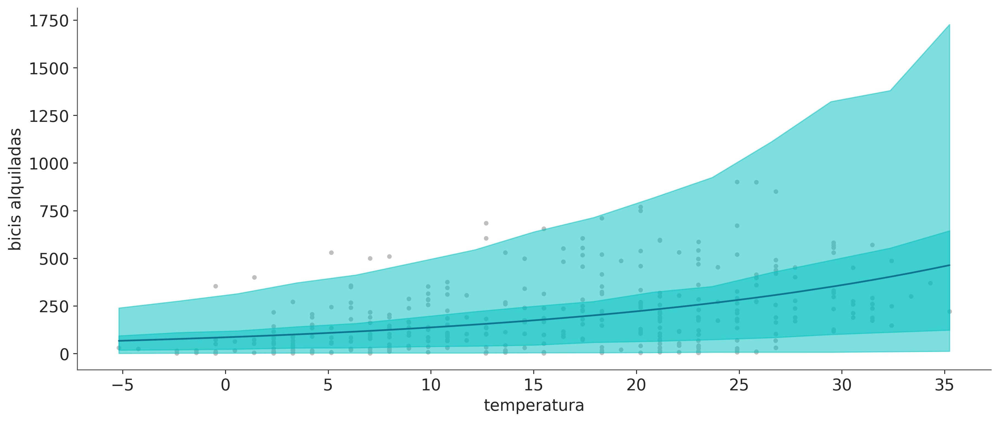

In [13]:
linea_media = idata_neg.posterior['μ'].mean(("chain", "draw"))
idx = np.argsort(bicis.temperatura.values)
x = np.linspace(bicis.temperatura.min(), bicis.temperatura.max(), 15)
y_pred_q = idata_neg.posterior_predictive['y_pred'].quantile([0.03, 0.97, 0.25, 0.75], dim=['chain', 'draw'])
y_hat_bounds = iter([PchipInterpolator(bicis.temperatura.values[idx], y_pred_q[i][idx])(x) for i in range(4)])

_, ax = plt.subplots(figsize=(12, 5))
ax.plot(bicis.temperatura, bicis.alquiladas, '.', color="0.75", zorder=-3)
ax.plot(bicis.temperatura[idx], linea_media[idx], c='C0')

for lb, ub in zip(y_hat_bounds, y_hat_bounds): 
    ax.fill_between(x,
                    lb, ub,
                    color="C1", alpha=0.5)

ax.set_xlabel('temperatura')
ax.set_ylabel('bicis alquiladas');

En la siguiente figura tenemos una  prueba predictiva a posteriori para `modelo_bl` a la izquierda y `modelo_neg` a la derecha. Podemos ver que cuando se usa una Normal, la discrepancia más grande es que el modelo predice valores negativos para las bicicletas alquiladas, pero incluso para los valores positivos vemos que el el ajuste no es tan bueno. Por otro lado, el modelo con la distribución NegativaBinomial ajusta mejor los datos. Aunque el ajuste no es del todo perfecto, vemos que la cola de la distribución es más pesada para las predicciones que para las observaciones, pero también observamos que la probabilidad de esta demanda tan alta es baja. Entonces, en general, reafirmamos que el modelo NegativoBinomial es mejor que el Normal.

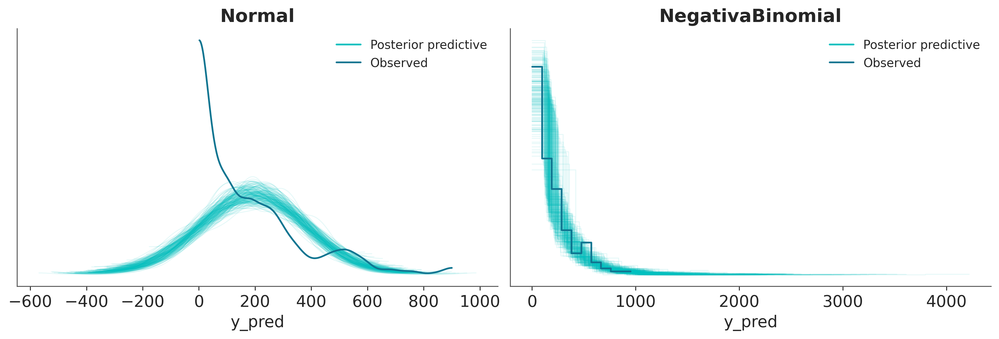

In [14]:
_, ax = plt.subplots(1, 2, figsize=(12, 4))
az.plot_ppc(idata_bl,  num_pp_samples=200,  alpha=0.1, colors=["C1", "C0", "C0"], ax=ax[0], mean=False)
az.plot_ppc(idata_neg, num_pp_samples=200,  alpha=0.1, colors=["C1", "C0", "C0"], ax=ax[1], mean=False)
ax[0].set_title("Normal")
ax[1].set_title("NegativaBinomial");

## Regresión robusta

Una vez estaba ejecutando una simulación compleja de un sistema molecular. En cada paso de la simulación, necesitabamos calcular una regresión lineal como paso intermedio. Teníamos razones teóricas y empíricas para pensar que nuestra "Y" era condicionalmente normal dada nuestra "X", por lo que la regresión lineal simple debía funcionar. Pero de vez en cuando la simulación generaba algunos valores de "Y" muy por encima o por debajo de la del grueso de los datos, esto arruinaba completamente nuestra simulación y teníamos que reiniciarla. Estos valores muy diferentes al grueso de los datos se denominan valores atípicos o aberrantes. El motivo del fracaso de nuestras simulaciones era que los valores atípicos estaban *tirando* de la línea de regresión hacia valores que daban un muy mal ajuste para el grueso de los datos y cuando pasabamos de esta estimación al siguiente paso de la simulación, todo se detenía. Resolvimos esto con la ayuda de nuestra buena amiga, la distribución T de Student, que como vimos anteriormente, tiene colas más pesadas que la distribución Normal. Esto significa que los valores atípicos tienen menos *influencia* en el resultado final, que se asemeja más al resultado que hubieramos obtenido en ausencia de los valores *atípicos*. Esto es un ejemplo de una regresión robusta.

Para ejemplificar la robustez que la distribución T de Student aporta a la regresión lineal, vamos a utilizar un conjunto de datos muy simple. Una versión ligeramente modificada del tercer grupo de datos del [cuarteto de Anscombe](https://en.wikipedia.org/wiki/Anscombe%27s_quartet).


En el siguiente modelo, estamos usando una exponencial desplazada (le sumamos 1) para evitar valores cercanos a cero. La distribución exponencial (no desplazada) pone demasiado peso en los valores cercanos a cero. En mi
experiencia, esto está bien para datos con valores atípicos "moderados", pero en algunos conjuntos de datos pequeños como este, es mejor evitar valores tan bajos. Esta recomendación, como otras, hay que tomarlas con una pizca de sal. Los valores por defecto son buenos puntos de partida, pero no es necesario ceñirse a ellos. Otro
priors comunes para Gamma(2, 0.1) o Gamma(mu = 20, sd = 15).

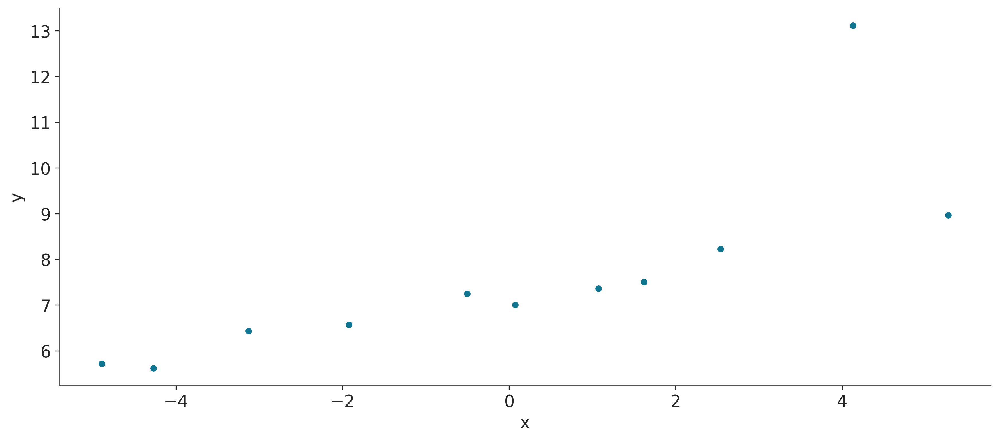

In [15]:
ans = pd.read_csv('datos/anscombe_3.csv')
ans.plot("x", "y", kind="scatter");

In [16]:
with pm.Model() as modelo_t:
    α = pm.Normal('α', mu=ans.y.mean(), sigma=1)
    β = pm.Normal('β', mu=0, sigma=1)
    σ = pm.HalfNormal('σ', 5)
    ν_ = pm.Exponential('ν_', 1/29)
    ν = pm.Deterministic('ν', ν_ + 1)
    μ = pm.Deterministic('μ', α + β * ans.x)
    _ = pm.StudentT('y_pred', mu=μ, sigma=σ, nu=ν, observed=ans.y)
    idata_t = pm.sample(2000, random_seed=123)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [α, β, σ, ν_]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 4 seconds.
There were 1 divergences after tuning. Increase `target_accept` or reparameterize.


En la siguiente figura podemos ver el ajuste robusto, según `model_t`, y el ajuste no robusto, según `linregress` de SciPy (esta función está haciendo una regresión por mínimos cuadrados).

Mientras que el ajuste no robusto trata de *comprometerse* e incluir todos los puntos, el ajuste Bayesiano robusto, `model_t`, automáticamente *descarta* (o le reduce *peso*) a un punto y ajusta una línea que pasa más cerca de todos los puntos restantes

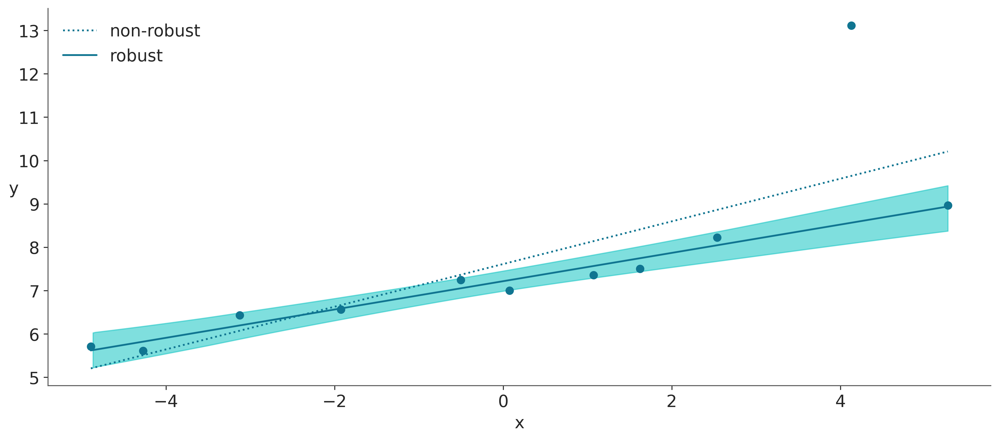

In [17]:
beta_c, alpha_c, *_ = linregress(ans.x, ans.y)

_, ax = plt.subplots()
ax.plot(ans.x, (alpha_c + beta_c * ans.x), 'C0:', label='non-robust')
ax.plot(ans.x, ans.y, 'C0o')
alpha_m = idata_t.posterior['α'].mean(("chain", "draw"))
beta_m = idata_t.posterior['β'].mean(("chain", "draw"))

x_plot = xr.DataArray(np.linspace(ans.x.min(), ans.x.max(), 50), dims="plot_id")
ax.plot(x_plot, alpha_m + beta_m * x_plot, c='C0', label="robust")
az.plot_hdi(ans.x, az.hdi(idata_t.posterior['μ'])['μ'].T, ax=ax)
ax.set_xlabel('x')
ax.set_ylabel('y', rotation=0)
ax.legend(loc=2);

En la siguiente figura podemos ver que obtenemos una muy buena coincidencia. También podemos ver que nuestro modelo predice valores alejados del grueso de los datos hacia ambos lados.

Sampling: [y_pred]


Output()

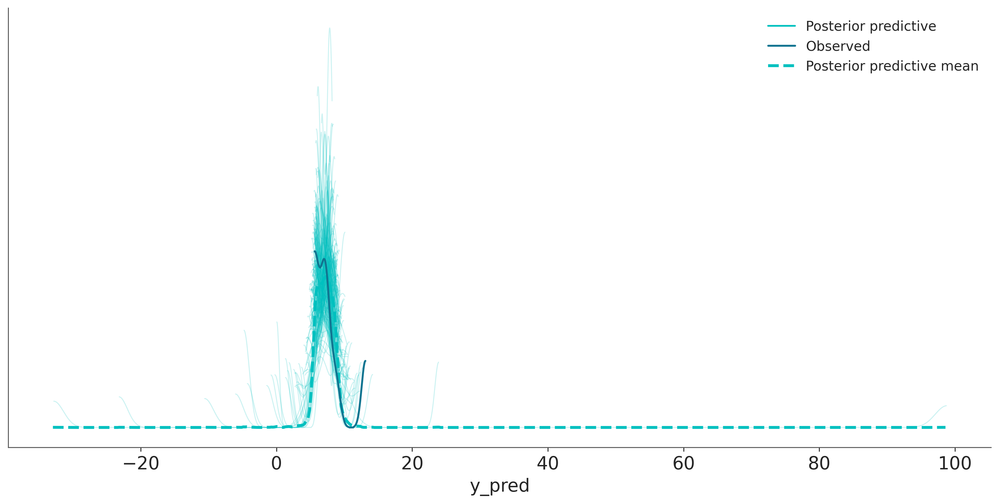

In [18]:
pm.sample_posterior_predictive(idata_t, model=modelo_t, random_seed=2, extend_inferencedata=True)
ax = az.plot_ppc(idata_t, num_pp_samples=200, figsize=(12, 6),  colors=["C1", "C0", "C1"])

## Regresión logística

La regresión logistica es la generalización del modelo de regresión simple para cuando la variable dependiente es binaria. Esta generalización se logra en dos pasos. Primero utilizamos la funcion logística como función inversa de enlace:

$$ \text{logística}(z) = \frac{1}{1 + e^{-z}} $$


Usamos esta función por que una de sus propiedades es que no importa el valor del argumento $z$, el resultado siempre será un valor en el intervalo [0, 1]. La función logística es conocida también como función sigmoide, por su aspecto típico de _S_ como se puede ver al ejecutar la siguiente celda:

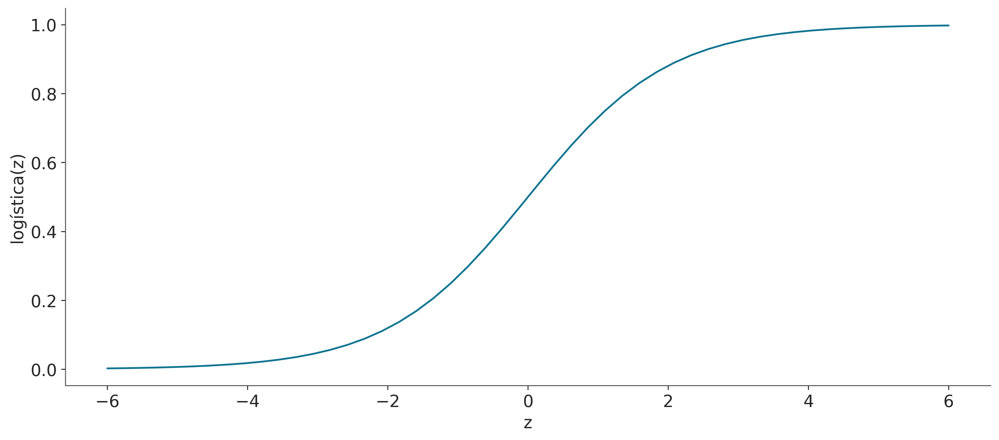

In [19]:
z = np.linspace(-6, 6)
logística = 1 / (1 + np.exp(-z))
plt.plot(z, logística)
plt.xlabel('z')
plt.ylabel('logística(z)');

El segundo paso consiste en usar como likelihood una distribución binomial y no una Gaussiana. De esta forma el modelo queda expresado como: 

$$
\begin{aligned}
\theta &= \text{logística}(\alpha + \beta X) \\
Y &\sim \text{Bern}(\theta)
\end{aligned}
$$

Este modelo se puede explicar de la siguiente forma. Si nuestros datos son binarios $y \in \{0, 1\}$, como con el ejemplo de la moneda, vemos que tiene sentido usar una distribución Bernoulli. Esta distribución está parametrizada por un único parámetro en el intervalo [0, 1], el cual puede ser generado desde un modelo lineal siempre y cuando los valores generados por el modelo lineal sean _comprimidos_ al intervalo [0, 1], algo que puede ser obtenido al emplear una función logística.

## El modelo logístico aplicado al conjunto de datos del iris.

Vamos a aplicar una regresión logística al conjunto de datos Iris. Este es un conjunto de datos clásico que contiene información sobre flores de 3 especies estrechamente relacionadas: setosa, virginica y versicolor. Estas serán nuestras variables dependientes, las clases que queremos predecir. Tenemos 50 individuos de cada especie y para cada individuo el conjunto de datos contiene cuatro variables que vamos a usar como variables independientes. Estas son el largo del pétalo, el ancho del pétalo, el largo del sépalo y el ancho del sépalo. Por si se lo están preguntando, los sépalos son hojas modificadas cuya función está generalmente relacionada con la protección de las flores en la yema.

In [20]:
iris = pd.read_csv('datos/iris.csv')
iris.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


Vamos a comenzar con la regresión logística más simple posible: dos clases, setosa y versicolor, y solo una variable independiente, la longitud del sépalo. Como se hace normalmente, vamos a codificar las variables categóricas setosa y versicolor con los números 0 y 1. Usando Pandas podemos hacer:

In [21]:
df = iris.query("species == ('setosa', 'versicolor')")
y_0 = pd.Categorical(df['species']).codes
x_n = 'sepal_length' 
x_0 = df[x_n].values
x_c = x_0 - x_0.mean()

Al igual que con otros modelos lineales, centrar los datos puede ayudar con el muestreo. Ahora que tenemos los datos en el formato adecuado, finalmente podemos construir el modelo con PyMC.

Observe cómo la primera parte del siguiente modelo se asemeja a un modelo de regresión lineal. Este modelo tiene dos variables deterministas: `θ` y` bd`. `θ` es la salida de la función logística aplicada a la variable `μ` y `bd` es límite de decisión (el cual explicaremos más adelante). Otro punto que vale la pena mencionar es que en lugar de escribir explícitamente la función logística estamos usando `pm.math.sigmoid`.

In [22]:
with pm.Model() as modelo_rl:
    α = pm.Normal('α', mu=0, sigma=1)
    β = pm.Normal('β', mu=0, sigma=5)
    
    μ = α + β * x_c   
    θ = pm.Deterministic('θ', pm.math.sigmoid(μ))
    bd = pm.Deterministic('bd', -α/β)
    
    yl = pm.Bernoulli('yl', p=θ, observed=y_0)

    idata_rl = pm.sample(random_seed=123)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [α, β]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.


In [23]:
az.summary(idata_rl, var_names='~θ')

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
bd,-0.050,0.059,-0.160,0.064,0.001,0.001,3673.0,2726.0,1.0
α,0.265,0.307,-0.294,0.852,0.005,0.004,3615.0,2750.0,1.0
β,5.187,1.012,3.462,7.241,0.018,0.014,3180.0,2344.0,1.0


Ahora vamos a graficar los datos junto con la curva sigmoide ajustada:

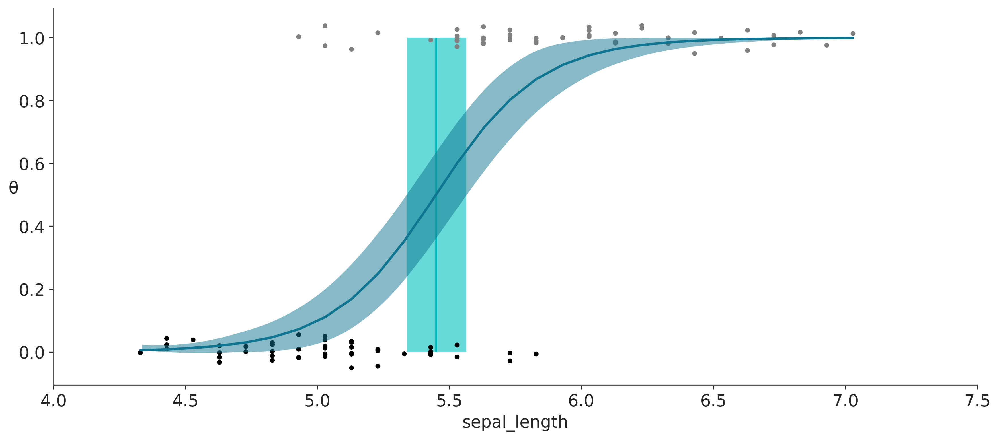

In [24]:
posterior = idata_rl.posterior
theta = posterior["θ"].mean(("chain", "draw"))
idx = np.argsort(x_c)

_, ax = plt.subplots()

ax.plot(x_c[idx], theta[idx], color='C0', lw=2)
ax.vlines(posterior['bd'].mean(("chain", "draw")), 0, 1, color='C1', zorder=0)
bd_hdi = az.hdi(posterior['bd'])
ax.fill_betweenx([0, 1], bd_hdi["bd"][0], bd_hdi["bd"][1], color='C1', alpha=0.6, lw=0)
ax.scatter(x_c, np.random.normal(y_0, 0.02), marker='.', color=[f'{0.5*x}' for x in y_0])
az.plot_hdi(x_c, posterior['θ'], color='C0', ax=ax, fill_kwargs={"lw": 0})
ax.set_xlabel(x_n)
ax.set_ylabel('θ', rotation=0)
# usar escala original para los xticks
locs, _ = plt.xticks()
ax.set_xticks(locs, np.round(locs + x_0.mean(), 1));

La figura anterior muestra la longitud del sépalo para las especies (setosa = 0, versicolor = 1). Para mitigar la superposición de los datos, hemos agregado ruido (_jitter_) a las variable-respuesta que es binaria. Una línea azul en forma de _S_ representa el valor medio de $\theta$. Esta línea se puede interpretar como la probabilidad que una flor sea versicolor dado el valor de longitud del sépalo. La banda azul semitransparente es el HDI 94%. 

## Clasificación con regresión logística

Mi madre prepara un plato delicioso llamado sopa seca, que básicamente es una receta a base de tallarines y que prácticamente no tienen agua. Si bien puede parecer un nombre inapropiado, el nombre del plato cobra total sentido cuando aprendemos cómo se cocina, una parte del agua que se agrega inicialmente se pierde por evaporación y la otra es absorvida por los fideos. Algo similar sucede con la regresión logística. Es usual que este modelo se muestre como un método de clasificación (y no de regresión). Veamos la fuente de esta dualidad.

Los problemas de regresión consisten en predecir un valor continuo para una variable de salida dados los valores de una o más variables de entrada. Y una clasificación es un problema de asignación de valores discretos a una variable de salida dadas unas variables de entrada. Por ejemplo, asignar la clases `versicolor` dada la longitud de su sépalo.

Entonces, ¿la regresión logística es una regresión o un método de clasificación? La respuesta es que es un método de regresión, solo que la regresión se hace sobre la probabilidad de pertenecer a una de dos clases.  Pero también es posible usar una regresión logística como clasificador. Lo único que necesitamos es una regla de decisión. Por ej asignár la clase `versicolor` si $\theta \ge 0.5$ y `setosa` en caso contrario.

La línea vertical en la figura anterior es el límite de decisión, y se define como el valor de la variable independiente que hace que la probabilidad de la clase 1 (versicolor en nuestro ejemplo) sea igual a 0,5. Para este modelo podemos calcular este valor analíticamente y es $-\frac{\alpha}{\beta}$.

A partir de la definición del modelo tenemos la relación:

$$\theta = \text{logística}(\alpha + x \beta)$$

Y a partir de la definición de la función logística tenemos que $\theta = 0.5$, cuando el argumento de la regresión logística es 0, es decir:

$$0.5 = \text{logística}(\alpha + x_i \beta) \Leftrightarrow 0 = \alpha + x_i \beta$$

Reordenando encontramos que el valor de $x_i$, para el cual, $\theta = 0.5$ corresponde a la expresión:

$$x_i = - \frac{\alpha}{\beta}$$


Resumiendo los puntos más importantes hasta el momento:

* El valor de $\theta$ es, en términos generales, $p(y= 1 \mid x)$. En este sentido, la regresión logística es en realidad una regresión, solo que estamos _regresionando_ la probabilidad que una observación pertenezca a la clase 1.

* Estamos modelando la media de una variable dicotómica, es decir, un número en el intervalo [0-1]. Luego, introducimos una regla para convertir esta probabilidad en una asignación de dos clases. En este caso, si $p(y = 1) >= 0.5$ asignamos clase 1, de lo contrario clase 0.

* No hay nada especial en el valor 0.5, aparte de que es el número en el medio entre 0 y 1. Podemos argumentar que este límite solo es razonable si estamos de acuerdo en cometer un error en una u otra dirección. En otras palabras, si es lo mismo para nosotros clasificar erróneamente una setosa como versicolor o una versicolor como setosa. Resulta que este no es siempre el caso, y el costo asociado a la clasificación errónea no tiene por qué ser simétrico.

## Interpretación de los coeficientes de una regresión logística

Debemos tener cuidado al interpretar los coeficientes $\beta$ de una regresión logística. La interpretación no es tan sencilla como con los modelos lineales en el capítulo anterior. La función logística introduce una no linearidad, que debemos tener en cuenta. Si $\beta$ es positivo, aumentar $x$ aumentará $p(y = 1)$ en cierta cantidad, pero la cantidad no es una función lineal de $x$, es en cambio una función no-lineal de $x$. Podemos visualizar este hecho en la figura anterior, en lugar de una línea con una pendiente constante, tenemos una línea en forma de S con una pendiente que cambia en función de $x$. Un poco de álgebra nos puede dar una idea de cuánto cambia $p(y=1)$ con $\beta$:

El modelo logístico básico es:

$$\theta = logistic (\alpha + X \beta) $$

El inverso de la logística es la función logit, que es:

$$ logit(z) = log \left (\frac{z}{1-z} \right)$$

Por lo tanto, si tomamos la primera ecuación en esta sección y aplicamos la función logit a ambos términos, obtenemos:

$$ logit(\theta) = \alpha + X \beta$$

O equivalente:

$$ log \left (\frac{\theta} {1-\theta} \right) = \alpha + X \beta$$

Recuerden que $\theta$ en nuestro modelo era la probabilidad de $y = 1$, por lo tanto:

$$ log \left(\frac {p(y = 1)} {1-p (y = 1)} \right) = \alpha + X \beta $$

La cantidad $$\frac{p (y = 1)} {1-p (y = 1)}$$ se conoce como **odds**. Los odds a favor se definen como la relación entre la probabilidad de éxito y la probabilidad de no éxito. Mientras que la probabilidad de obtener 2 tirando un dado es 1/6, los odds para el mismo evento son $\frac{1/6}{5/6} = 0.2$ o dicho de otra forma 1 evento favorable frente a 5 eventos desfavorables. Mientras las probabilidades toman valores en el intervalo [0, 1], los odds lo hacen en $[0, \infty)$. Veamos otro ejemplo, si la probabilidad de lluvia mañana es $\frac{3}{4}$, entonces la probabilidad de que no llueva es $\frac{1}{4}$ y entonces el odds será de 3. Es decir es tres veces más probable que llueva respecto de que no llueva. Si en cambio la probabilidad fuese $\frac{1}{2}$ entonces el odds sería 1. Es tan probable que llueva como que no lo haga. Los odds suelen ser utilizadas por los apostadores ya que proporcionan una herramienta más intuitiva que las probabilidades _en bruto_ cuando se piensa en la forma correcta de apostar. 

> En una regresión logística, el coeficiente $\beta$ codifica el aumento en unidades de log-odds por unidad de aumento de la variable $x$.

La transformación de probabilidad a odds es una transformación monotónica, lo que significa que los odds aumentan a medida que aumenta la probabilidad. Mientras que las probabilidades están restringidas al intervalo $[0, 1]$, los odds viven en el intervalo $[0, \infty]$. El logaritmo es otra transformación monótonica y los log-odds están en el intervalo $[-\infty, \infty]$. La  siguiente figura muestra cómo la probabilidad está relacionada con los odds y los log-odds.

/tmp/ipykernel_12140/2677285095.py:2: RuntimeWarning: divide by zero encountered in divide
  odds = probability / (1 - probability)


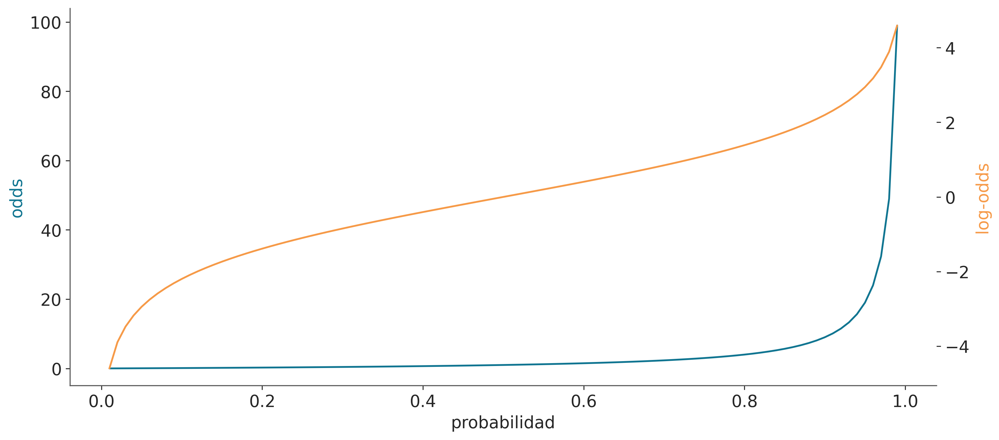

In [25]:
probability = np.linspace(0.01, 1, 100)
odds = probability / (1 - probability)

_, ax1 = plt.subplots()
ax2 = ax1.twinx()
ax1.plot(probability, odds, 'C0')
ax2.plot(probability, np.log(odds), 'C2')

ax1.set_xlabel('probabilidad')
ax1.set_ylabel('odds', color='C0')
ax2.set_ylabel('log-odds', color='C2');

## Varianza variable

Hemos estado usando el modelo lineal para modelar la media de una distribución, dejando la varianza de lado. En caso que consideremos que el supuesto de varianza constante no tiene sentido podemos considerar la varianza como una función (lineal) de la variable dependiente.

La Organización Mundial de la Salud y otras instituciones de salud de todo el mundo recopilan datos para recién nacidos y diseñan estándares de crecimiento. Estas tablas son un componente esencial del conjunto de herramientas pediátricas y también como una medida del bienestar general de las poblaciones con el fin de formular políticas de salud, planificar intervenciones y controlar su eficacia. Un ejemplo de tales datos son la longitud (alturas) de las niñas recién nacidas en función de la edad (en meses):

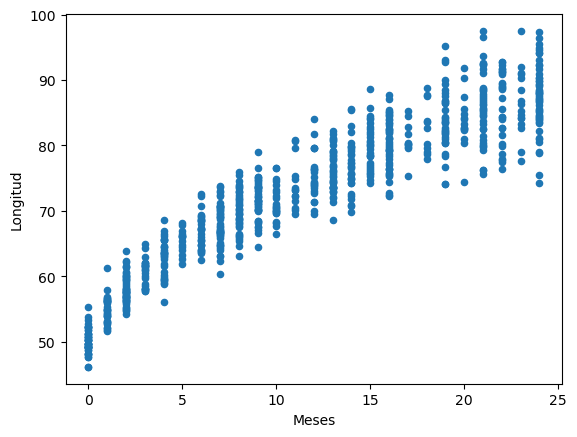

In [14]:
data = pd.read_csv('datos/babies.csv')
data.plot.scatter('Meses', 'Longitud');

Para modelar estos datos, presentaremos 3 elementos nuevos en comparación con los modelos anteriores:

* $\sigma$ ahora es una función lineal de $x$, y para hacer esto agregamos dos nuevos parámetros $\gamma$ y $\delta$, estos son análogos directos de $\alpha$ y $\beta$.
* El modelo lineal para la media es una función de $\sqrt{x}$, esto es solo un truco simple para ajustar un modelo lineal a una curva.
* Hemos definido una variable compartida `x_shared`, esto nos permitirá cambiar los valores de la variable $x$ (`Meses` en este ejemplo) sin la necesidad de volver a muestrear el modelo. Esto quedará más claro con el ejemplo.

In [15]:
with pm.Model() as model_vv:
    x_shared = pm.MutableData("x_shared", data.Meses.values.astype(float))
    α = pm.Normal('α', sigma=10)
    β = pm.Normal('β', sigma=10)
    γ = pm.HalfNormal('γ', sigma=10)
    δ = pm.HalfNormal('δ', sigma=10)

    μ = pm.Deterministic('μ', α + β * x_shared**0.5)
    σ = pm.Deterministic('σ', γ + δ * x_shared)
    
    y_pred = pm.Normal('y_pred', mu=μ, sigma=σ, observed=data.Longitud)
    
    idata_vv = pm.sample(random_seed=123)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [α, β, γ, δ]


Output()

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 40 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


La siguiente figura muestra el resultado de nuestro modelo. La media de $\mu$ es representada con una curva negra, y las dos bandas turquesa semitransparentes representan 1 y 2 desviaciones estándar.

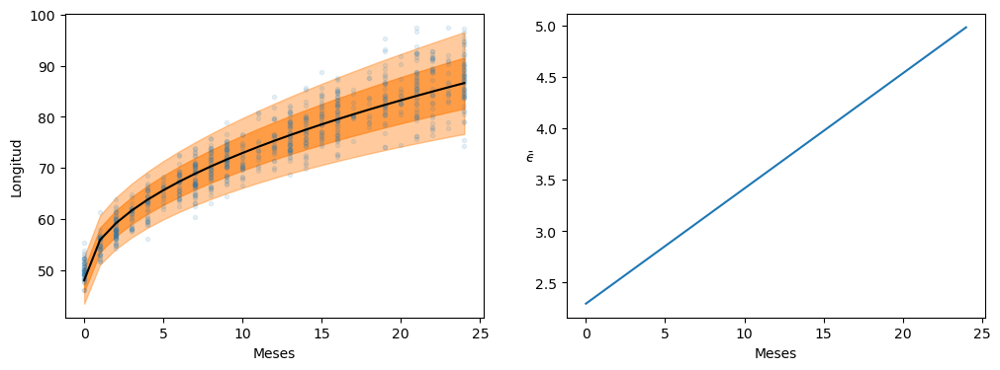

In [16]:
_, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].plot(data.Meses, data.Longitud, 'C0.', alpha=0.1);

posterior = az.extract(idata_vv)

μ_m = posterior['μ'].mean("sample").values
σ_m = posterior['σ'].mean("sample").values

axes[0].plot(data.Meses, μ_m, c='k')
axes[0].fill_between(data.Meses, μ_m + 1 * σ_m, μ_m - 1 * σ_m, alpha=0.6, color='C1')
axes[0].fill_between(data.Meses, μ_m + 2 * σ_m, μ_m - 2 * σ_m, alpha=0.4, color='C1')

axes[0].set_xlabel('Meses')
axes[0].set_ylabel('Longitud');


axes[1].plot(data.Meses, σ_m)
axes[1].set_xlabel('Meses');
axes[1].set_ylabel(r'$\bar ϵ$', rotation=0);

Ahora que tenemos ajustado el modelo podríamos querer usar el modelo para averiguar cómo se compara la longitud de una niña en particular respecto de la distribución. Una forma de responder a esta pregunta es preguntarle al modelo por la distribución de la variable _longitud_ para bebas de digamos de 0.5 meses. Usando PyMC podemos hacer estas preguntas con la función `pm.sample_posterior_predictive`, ya que esto arrojará muestras de $\tilde y$ es decir los valores predichos considerando la incertidumbre de los parámetros. El único problema es que, por defecto, esta función devolverá valores de $\tilde y$ para los valores observados de $x$, es decir los valores usando para ajustar el modelo. Pero que pasa si queremos obtener predicciones para que el modelo no vio? Como 0,5 meses que no es parte de los datos originales. La manera más fácil de obtener predicciones para valores no observados es definir una variable compartida (`x_shared` en el ejemplo) y luego actualizar el valor de la variable compartida justo antes del muestreo de la distribución predictiva _a posteriori_.

In [17]:
with model_vv:
    pm.set_data({"x_shared": [0.5]})
    ppc = pm.sample_posterior_predictive(idata_vv, random_seed=123)
    y_ppc = ppc.posterior_predictive['y_pred'].stack(sample=("chain", "draw"))

Sampling: [y_pred]


Output()

In [20]:
idata_vv

Inference data with groups:
	> posterior
	> sample_stats
	> observed_data
	> constant_data

Ahora podemos graficar la distribución esperada de las longitudes para las bebas con 2 semanas de vida y calcular cantidades adicionales, por ejemplo, el percentil de una niña de esa longitud:

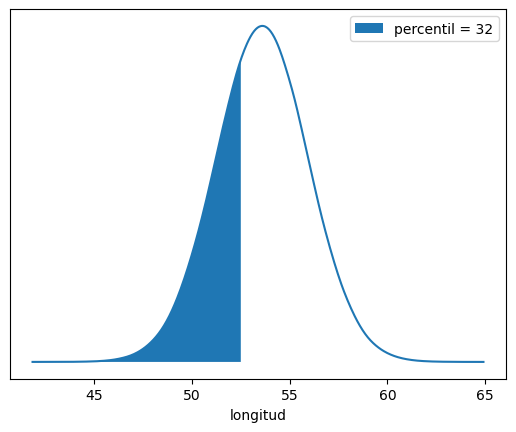

In [18]:
ref = 52.5
grid, pdf = az.stats.density_utils._kde_linear(y_ppc.values)
plt.plot(grid, pdf)
percentile = int((y_ppc <= ref).mean() * 100)
plt.fill_between(grid[grid < ref], pdf[grid < ref], label='percentil = {:2d}'.format(percentile))
plt.xlabel('longitud')
plt.yticks([])
plt.legend();

## Regresión por cuantiles


En los ejemplos anteriores nos focalizamos en usar un modelo lineal para estimar la media de la variable respuesta, también vimos que es posible usar la misma idea para estimar la varianza. Además, aprendimos que usar un likelihood Normal es solo una de muchas opciones, como Binomial, Negativa Binomial, t de Student, etc. 

En esta sección vamos a discutir un modelo lineal, cuyo objetivo no es la estimación de media o varianza, en cambio la estimación de [cuantiles](https://es.wikipedia.org/wiki/Cuantil). Cuando el cuantil a estimar es la mediana, la motivación suele ser la necesidad de una regresión robusta. Así como la mediana es un estimador de la media, robusto a valores extremos, una *regresión mediana* será también robusta. En ese caso la regresión por cuantiles cumpliría una función similar al modelo robusto que vimos anteriormente usando una distribución t de Student. Otras veces, la motivación está en modelar cuantiles específicos por que estos son "intrínsecamente" de interés. Esto sucede por ejemplo cuando nos interesa modelador valores en los extremos de una distribución. Por ejemplo podríamos estar interesados en modelar temperaturas altas, o eventos de lluvia intensos. A veces también se usa para explorar relaciones entre variables cuando no hay relación entre las medias de dichas variables, o cuando esta es muy débil. Una disciplina donde las regresiones por cuantiles son frecuentes es la ecología. Esto se debe posiblemente, a que la existencia de complejas interacciones entre variables, donde el efecto de una variable sobre otra es distinto para distintos rangos de la variable.

Para hacer regresiones por cuantiles utilizamos la distribución asimétrica de Laplace como likelihood. Esta distribución la podemos pensar como dos distribuciones exponenciales espalda-con-espalda. La distribución tiene 3 parámetros $\mu$ controla la localización, $\sigma$ la escala y $q$ la asimetría. $q$ varía entre [0, 1], cuando $q=0.5$ la distribución asimétrica de Laplace es en realidad simétrica. Este caso especial es conocido también como distribución de Laplace. Cuando hacemos regresión por cuantiles, podemos pensar a $q$ como los cuantiles que nos interesa asociar con la variable respuesta. Por ejemplo, si $q=0.5$ estamos modelando la mediana, si $q=0.25$ estamos modelando el primer cuartil, etc.


La siguiente figuras muestras tres distribuciones de esta familia.

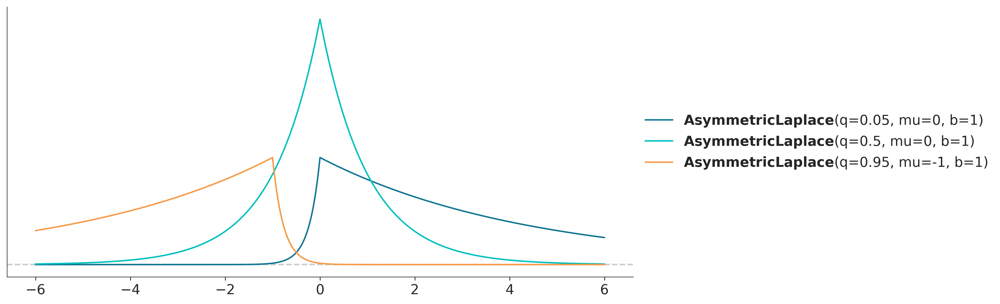

In [31]:
q = np.array([0.05, 0.5, 0.95])
for q_i, mu in zip(q, [0, 0, -1]):
    pz.AsymmetricLaplace(mu=mu, b=1, q=q_i).plot_pdf(support=(-6, 6))

Quiere decir esto que al hacer una regresión por cuantiles estamos asumiendo que la variable respuesta se distribuye (condicionalmente) como una Asimétrica de Laplace? No necesariamente.

Una forma alternativa de pensar el likelihood, es como una función de error (o de diferencia) entre el ajuste lineal y los datos. Al elegir una distribución determinada estamos, indirectamente, eligiendo como penalizaremos esa diferencia y al hacer inferencia estámos encontrando la distribución de parámetros que reducen esa diferencia. Usando esta lógica podemos pensar que una gaussiana le asigna un determinado peso a valores alejados de la media y una t de Student le asigna un menor peso, y por ende terminamos teniendo un ajuste más robusto. De la misma forma una asimétrica de Laplace le asigna una determinado peso a estas diferencias de forma tal que el resultado final es ajustar cuantiles en vez de medias. Si esto les suena extraño es por que están prestando atención.

Para ejemplificar la regresión por cuantiles vamos a usar el dataset de las longitudes de bebés que usamos anteriormente. Vamos a ajustar 3 cuantiles al mismo tiempo, 0.05, 0.5, 0.95. Esto nos va a permitir ver como cambia la relación entre las variables a medida que nos movemos de los cuantiles bajos a los altos. Para esto vamos a "apilar" el dataset 3 veces, una para cada cuantil. 

In [32]:
y_con = np.stack([data.Longitud.values]* 3).T
x_con = np.stack([data.Meses.values]* 3).T

In [33]:
with pm.Model() as model_q:
    α = pm.Normal('α', 50, 3, shape=3)
    β = pm.Normal('β', 0, 5, shape=3)
    σ = pm.HalfNormal('σ', 5)

    μ = pm.Deterministic('μ', α + β * x_con**0.5)
    
    y_pred = pm.AsymmetricLaplace('y_pred',  mu=μ, b=σ, q=q, observed=y_con)
    
    idata_q = pm.sample(random_seed=123)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [α, β, σ]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 11 seconds.


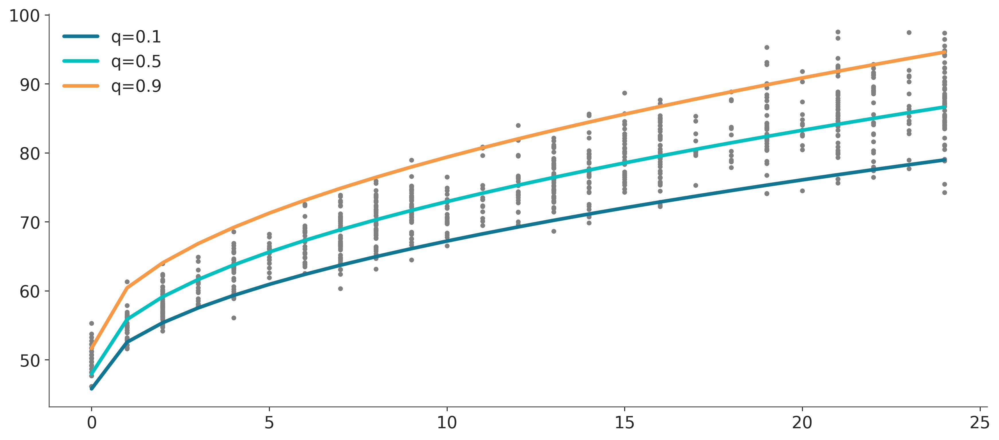

In [34]:
plt.plot(data.Meses, data.Longitud, ".", color="0.5")
for idx, label in enumerate(("q=0.1", "q=0.5", "q=0.9")):
    plt.plot(data.Meses.values, idata_q.posterior["μ"].mean(("chain", "draw"))[:,idx],
            label=label, lw=3);
    
plt.legend();

Para que sea más claro que estámos haciendo al hacer una regresión por cuantiles, comparemos el resultado con una regresión "normal".

In [35]:
with pm.Model() as model_n:
    α = pm.Normal('α', 50, 3)
    β = pm.Normal('β', 0, 5)
    σ = pm.HalfNormal('σ', 5)

    μ = pm.Deterministic('μ', α + β * data.Meses.values**0.5)
    
    y_pred = pm.Normal('y_pred',  μ, σ, observed=data.Longitud.values)
    
    idata_n = pm.sample(random_seed=123)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [α, β, σ]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 4 seconds.


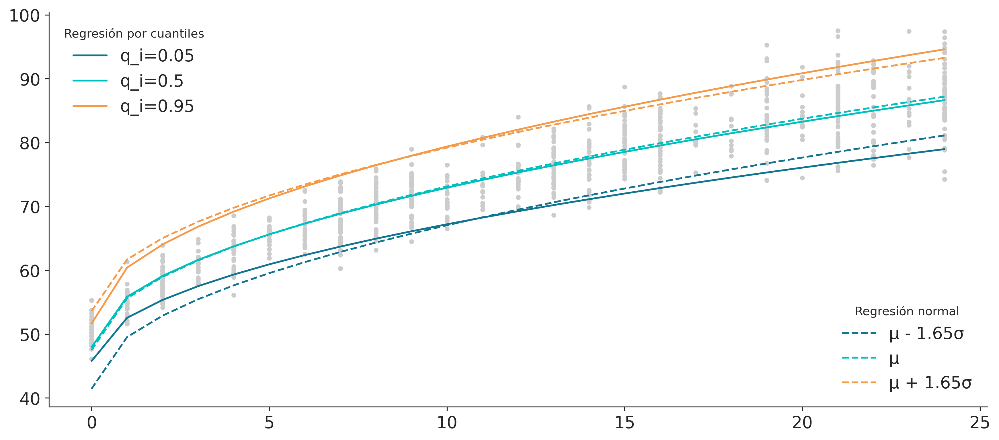

In [36]:
fig, ax = plt.subplots()

ax.plot(data.Meses, data.Longitud, ".", color="0.8")
lines = []
for idx, label in enumerate([f"{q_i=:}" for q_i in q]):
    line, = ax.plot(data.Meses,
                   idata_q.posterior["μ"].mean(("chain", "draw"))[:,idx],
                   label=label)
    lines.append(line)
    
q_legend = ax.legend(handles=lines, loc='upper left', title="Regresión por cuantiles")

# aproximamos los cuantiles de la distribución posterior
q_95 = (idata_n.posterior["μ"] + idata_n.posterior["σ"]*1.65).mean(("chain", "draw"))
q_05 = (idata_n.posterior["μ"] - idata_n.posterior["σ"]*1.65).mean(("chain", "draw"))

line0, = ax.plot(data.Meses, q_05, "C0", label="μ - 1.65σ", ls="--")
line1, = ax.plot(data.Meses, idata_n.posterior["μ"].mean(("chain", "draw")), "C1", label="μ", ls="--")
line2, = ax.plot(data.Meses, q_95, "C2", label="μ + 1.65σ", ls="--");

ax.add_artist(q_legend)

ax.legend(handles=[line0, line1, line2], loc='lower right', title="Regresión normal");

Podemos ver que al usar una distribución Normal y a partir de ella computar los cuantiles, q=0.1 ($\mu - 1.65\sigma$) y q=0.9  ($\mu + 1.65\sigma$) estos son simétricos respecto de la media $\mu$. Además podemos ver que la forma de la curva es esencialmente la misma para los 3 casos, solo que desplazada hacia arriba o abajo. Además las curvas generadas al usar la distribución asimétrica de Laplace permite acomodarse a la varianza no constante, vean como las curvas empiezan muy cerca en el mes cero y se van separando a medida que pasan los meses.

## Regresión lineal jerárquica

Hace dos capítulos, aprendimos los rudimentos de los modelos jerárquicos. Este mismo concepto se puede aplicar a las regresiones lineales. Esto permite que los modelos realicen inferencias a nivel de subgrupo y a nivel global. Como ya vimos, esto se hace incluyendo hiperpriors.

Vamos a crear ocho grupos de datos relacionados, incluido un grupo con un solo dato

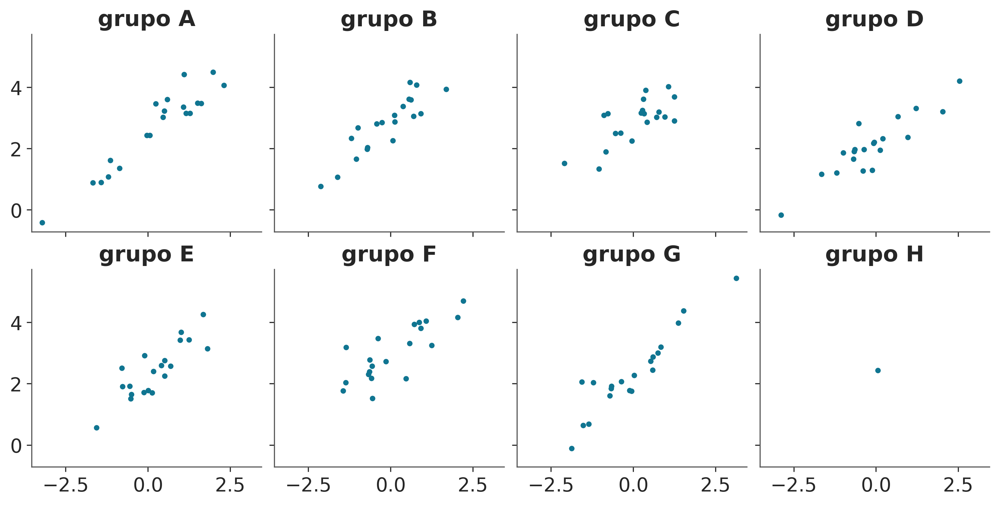

In [37]:
N = 20
grupos = ["A", "B", "C", "D", "E", "F", "G", "H"]
M = len(grupos)
idx = np.repeat(range(M - 1), N)
idx = np.append(idx, 7)
np.random.seed(314)
alpha_real = np.random.normal(2.5, 0.5, size=M)
beta_real = np.random.beta(6, 1, size=M)
eps_real = np.random.normal(0, 0.5, size=len(idx))
y_m = np.zeros(len(idx))
x_m = np.random.normal(0, 1, len(idx))
y_m = alpha_real[idx] + beta_real[idx] * x_m + eps_real
_, ax = plt.subplots(2, 4, figsize=(10, 5), sharex=True, sharey=True)
ax = np.ravel(ax)
j, k = 0, N
for i, g in enumerate(grupos):
    ax[i].scatter(x_m[j:k], y_m[j:k], marker=".")
    ax[i].set_title(f"grupo {g}")
    j += N
    k += N

Veamos un posible modelo para estos datos:

In [38]:
coords = {"grupo": grupos}

with pm.Model(coords=coords) as modelo_jerárquico:
    # hyper-priors
    α_μ = pm.Normal("α_μ", mu=y_m.mean(), sigma=1)
    α_σ = pm.HalfNormal("α_σ", 5)
    β_μ = pm.Normal("β_μ", mu=0, sigma=1)
    β_σ = pm.HalfNormal("β_σ", sigma=5)

    # priors
    α = pm.Normal("α", mu=α_μ, sigma=α_σ, dims="grupo")
    β = pm.Normal("β", mu=β_μ, sigma=β_σ, dims="grupo")
    σ = pm.HalfNormal("σ", 5)
    _ = pm.Normal("y_pred", mu=α[idx] + β[idx] * x_m, sigma=σ, observed=y_m)

    idata_mj = pm.sample(random_seed=123)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [α_μ, α_σ, β_μ, β_σ, α, β, σ]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 8 seconds.
There were 172 divergences after tuning. Increase `target_accept` or reparameterize.
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


Vemos que obtenemos un mesaje de advertencia indicando divergencias y dos sugerencias para solucionar el problema. La primera es incrementar `target_accept` la segunda reparametrizar. Este mensaje indica que las muestras generadas por PyMC pueden no ser confiables, esto se vincula a los diagnósticos que vimos en el capítulo anterior.

La primer sugerencias es aumentar `target_accept`, que es un argumento de `pm.sample()` que por defecto toma el valor 0.8 y puede tomar valores en el intervalo (0, 1). Si ves divergencias, como en este caso, cambiar el valor por defecto a valores tales como 0.85, 0.9 o incluso más puede ayudar. En algunos casos incluso valores altos como 0.99 no serán de ayuda. Un efecto adverso de aumentar `target_accept` es que el sampler suele demorar más en generar una misma cantidad de muestras. 

Si las divergencias no desaparecen al cambiar `target_accept`, en general la única solución es reparametrizar. ¿Qué es esto? Reparametrizar es escribir un modelo de una manera diferente, pero matemáticamente equivalente a su versión original. Muchos modelos (por no decir todos) se pueden escribir de formas alternativas. A veces, la reparametrización puede tener un efecto positivo en la eficiencia del método de muestreo o en la interpretabilidad del modelo. Por ejemplo, al reparametrizar podemos eliminar las divergencias.

Si prueban volver a correr `modelo_jerárquico` pero con valores más altos de `target_accept` verán que las divergecias disminuyen pero no desaparecen. Lamentablemente esto es algo común con modelos lineales jerárquicos, lo bueno es que existe una reparametrización que suele solucionar el problema.  La reparametrización consiste en reescribir el modelo de la siguiente forma:

En vez definir $\beta \sim \mathcal{N}(\beta_\mu, \beta_\sigma)$  como en `modelo_jerárquico` vamos a escribir $\beta = \beta_\mu + \beta_\text{offset} * \beta_\sigma$. Donde $\beta_\text{offset}$ es una distribución normal con media 0 y desviación estándar 1. Conceptualmente la diferencia es que en el primer caso estamos modelando la pendiente de cada grupo de forma explícita, mientras que en el segundo caso lo estamos haciendo como una desviación respecto de un valor común ($\beta_\mu$). A la primer versión se la suele llamar centrada y a la segunda no-centrada. Veamos como queda el modelo no-centrado en PyMC:

In [39]:
with pm.Model(coords=coords) as jerárquico_no_centrado:
    # hyper-priors
    α_μ = pm.Normal("α_μ", mu=y_m.mean(), sigma=1)
    α_σ = pm.HalfNormal("α_σ", 5)
    β_μ = pm.Normal("β_μ", mu=0, sigma=1)
    β_σ = pm.HalfNormal("β_σ", sigma=5)

    # priors
    α = pm.Normal("α", mu=α_μ, sigma=α_σ, dims="grupo")

    β_offset = pm.Normal("β_offset", mu=0, sigma=1, dims="grupo")
    β = pm.Deterministic("β", β_μ + β_offset * β_σ, dims="grupo")

    σ = pm.HalfNormal("σ", 5)
    _ = pm.Normal("y_pred", mu=α[idx] + β[idx] * x_m, sigma=σ, observed=y_m)

    idata_ncen = pm.sample(target_accept=0.85, random_seed=123)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [α_μ, α_σ, β_μ, β_σ, α, β_offset, σ]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 10 seconds.


Al correr `jerárquico_no_centrado` sin modificar ``target_accept`` verán todavía quedan unas pocas divergencias. 2 en mi caso, un número tan bajo no suele ser problemático. Pero para estar seguros podemos aumentar `target_accept` a 0.85, como en el bloque de código anterior. Al hacer eso veremos que no hay divergencias y podremos seguir con nuestro análisis. Pero antes de hacer eso veamos que es lo que estamos haciendo al reparametrizar.

La siguiente figura muestra muestra dos paneles, a la izquierda tenemos un gráfico de dispersión entre los valores de $\log \beta_\sigma$ (el logaritmo de la desviación estándar global) y $\beta_B$. A la derecha entre $\log \beta_\sigma$ y la pendiente del grupo H. Los puntos negros representan divergencias. En ambos casos se observa una forma de "embudo" más ancha arriba y más angosta abajo (esto es más acentuado en el panel de la derecha). En ambos casos a medida que $\beta_\sigma$ aumenta el embudo se ensancha, ya que la dispersión de $\beta$ aumenta. Esto es razonable ya que precisamente $\beta_\sigma$ controla cuan variable puede ser $\beta$ respecto de su media. En si mismo esto no es un problema, es simplemente una consecuencia directa del modelo. Pero si es un problema para el método de muestreo, como vimos en el capítulo anterior, para obtener un método eficiente el método de muestreo debe "aprender" ciertos hiper-parámetros. El problema que en una geometría como el embudo, no hay un solo conjunto de hiper-parámetros que sean lo suficientemente buenos para muestrear tanto la boca del embudo como su pico. En general el método "aprende" a muestrear la parate ancha y cuando se aproxima a la parte angosta la trayectoria "diverge" de la correcta. Es como si usáramos los cálculos para poner un satélite en orbita de la tierra, para ponerlo en órbita de la luna, perderíamos el satélite en el espacio.


Nota: Para la figura usamos $\log \beta_\sigma$ en vez de $\beta_\sigma$, por que esto es lo que "ve" el sampler. Por qué? Por que internamente PyMC muestrea los parámetros en un espacio sin "bordes" para eso convierte distribuciones como la Beta que tienen soporte en el intervalo (0, 1) a una distribución que tiene soporte en todo el espacio real. Lo mismo hace con distribuciones como la media-normal. En el caso de esta última la transformación es logarítmica. Una vez terminado el muestreo PyMC invierte la trasformación quedando los parámetros en la escala original y por eso nosotros vemos los valores de $\beta_\sigma$ y no $\log \beta_\sigma$. Pero el sampler ve $\log \beta_\sigma$ por eso es conveniente graficar en esa escala.

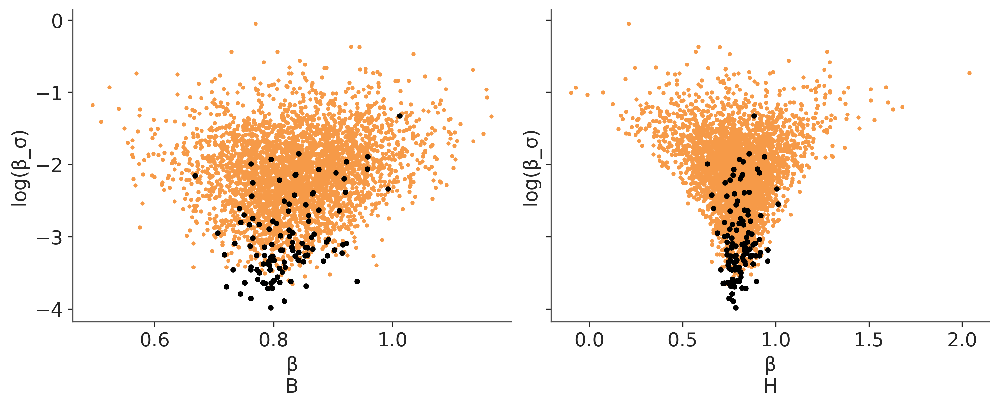

In [40]:
idata_mj.posterior["log(β_σ)"] = np.log(idata_mj.posterior["β_σ"])

_, axes = plt.subplots(1, 2, sharey="row", sharex="col", figsize=(10, 4))

nvars = ["log(β_σ)", "log(β_σ)"]
glabel = ["B", "H"]
for ax, var, gl in zip(axes.ravel(), nvars, glabel):
    az.plot_pair(
        idata_mj,
        var_names=["β", var],
        coords={"grupo": [gl]},
        divergences=True,
        scatter_kwargs={"color": "C2"},
        divergences_kwargs={"color": "k", "marker": ".", "mec": None},
        ax=ax,
    )

Ahora bien, que pasa cuando usamos un modelo jerárquico no centrado? Veamos la siguiente figura:  

Ahora tenemos 4 paneles, en la primer fila vemos  $\log \beta_\sigma$ vs $\log \beta_{offset}$, que es la nueva variable que introdujimos en la versión no centrada. Ahora vemos que el posterior es más "esférico" o al menos que la forma de embudo es mucho menos pronunciada. Esta geométrica es mucho más simple de muestrear que la anterior y por eso no observamos divergencias. 

En la segunda fila vemos $\log \beta_\sigma$ vs $\beta$, ahora vemos que el embudo es aún más acentuado que en la figura anterior. Esto no debería ser aún más problemático? En realidad no, esto no es un problema para el sampler por que  el sampler nunca "ve" este embudo ya que $\beta$ lo obtenemos al combinar $\beta_\text{offset}$, $\beta_\sigma$ y $\beta_\mu$. Es decir con la reparametrización logramos obtener un embudo más "profundo", pero sin muestrearlo directamente! 

Ahora que quiere decir que ahora el embudo sea "más profundo"? Quiere decir que ahora somos capaces de muestrear una región de la distribución a posteriori que antes no podíamos. En la versión centrada del modelo el sampler divergía antes de poder encontrar la zona angosta y por lo tanto esa zona NO estaba presente en la distribución a posteriori. Nos estábamos perdiendo parte de la distribución a posteriori, que si no fuera por las divergencias no sabríamos que existe y estaríamos trabajando con una distribución a posteriori sesgada sin siquiera saberlo.

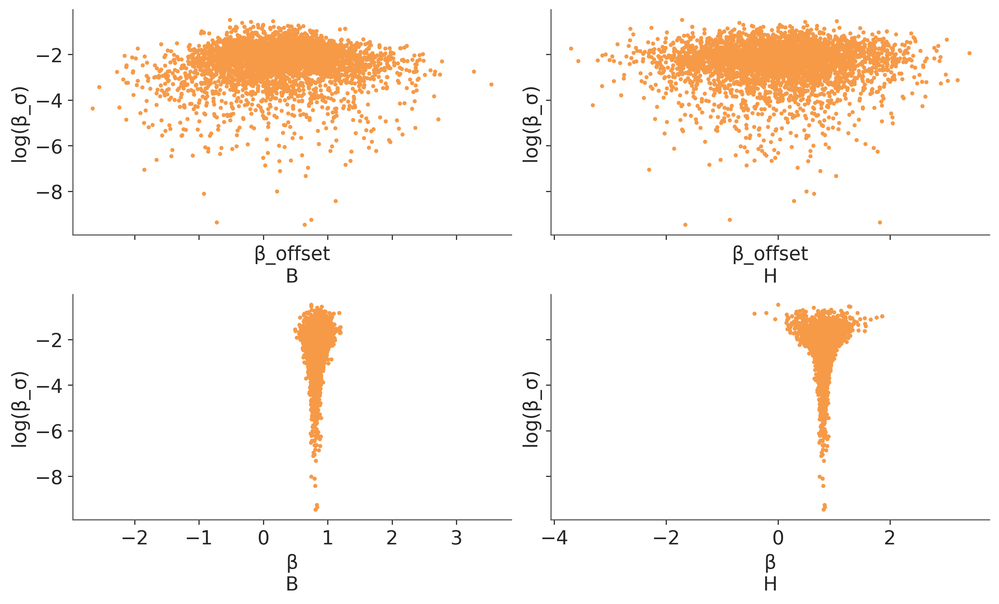

In [41]:
idata_ncen.posterior["log(β_σ)"] = np.log(idata_ncen.posterior["β_σ"])

_, axes = plt.subplots(2, 2, sharey="row", sharex="col", figsize=(10, 6))

nvars = np.repeat(["β_offset", "β"], 2)
glabel = ["B", "H"] * 2

for ax, var, gl in zip(axes.ravel(), nvars, glabel):
    az.plot_pair(
        idata_ncen,
        var_names=[var, "log(β_σ)"],
        coords={"grupo": [gl]},
        divergences=True,
        scatter_kwargs={"color": "C2"},
        divergences_kwargs={"color": "k", "marker": ".", "mec": None},
        ax=ax,
    )

Ahora que nuestras muestras están libres de divergencias, podemos continuar con el análisis de los resultados. La siguiente figura muestra los valores estimados para $\alpha$ y $\beta$. Podemos ver como las estimaciones para el grupo H son las de mayor incertidumbre. Lo cual es razonable dado que tenemos un solo punto. 

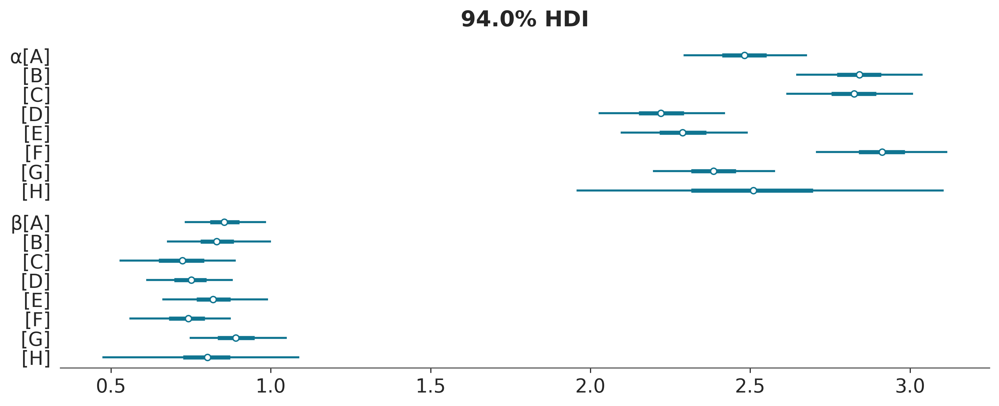

In [42]:
az.plot_forest(idata_ncen, var_names=['α', 'β'], figsize=(10, 4), combined=True);

La siguiente figura muestra las líneas ajustadas para cada uno de los ocho grupos. Podemos ver que logramos ajustar una línea a un solo punto. Al principio, esto puede sonar extraño o incluso sospechoso, pero es solo una consecuencia de la estructura del modelo jerárquico. Cada línea está informada por las líneas de los otros grupos, por lo que no estamos realmente ajustando una línea a un solo punto. En cambio, estamos ajustando una línea que ha sido informada por los puntos en los otros grupos a un solo punto.

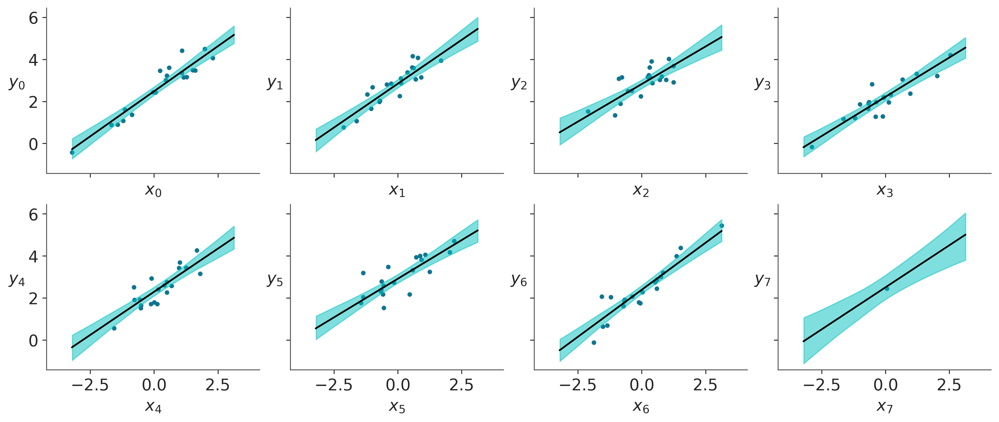

In [43]:
_, ax = plt.subplots(2, 4, figsize=(12, 5), sharex=True, sharey=True)
ax = np.ravel(ax)
j, k = 0, N
x_range = np.linspace(x_m.min(), x_m.max(), 10)
posterior = az.extract(idata_ncen)

for i, g in enumerate(grupos):
    ax[i].scatter(x_m[j:k], y_m[j:k], marker=".")
    ax[i].set_xlabel("$x_{}$".format(i))
    ax[i].set_ylabel("$y_{}$".format(i), labelpad=10, rotation=0)
    alfas = posterior["α"].sel(grupo=g)
    betas = posterior["β"].sel(grupo=g)
    alfa_m = alfas.mean("sample").item()
    beta_m = betas.mean("sample").item()
    ax[i].plot(x_range, alfa_m + beta_m * x_range, c="k")
    az.plot_hdi(x_range, alfas + betas * xr.DataArray(x_range).transpose(), ax=ax[i])
    plt.xlim(x_m.min() - 1, x_m.max() + 1)
    plt.ylim(y_m.min() - 1, y_m.max() + 1)
    j += N
    k += N

## Regresión lineal múltiple

Hasta ahora, hemos estado trabajando con una variable dependiente y una variable independiente. Sin embargo, no es inusual tener varias variables independientes que queremos incluir en nuestro modelo. Algunos ejemplos podrían ser:

* Calidad percibida del vino (dependiente) y acidez, densidad, grado alcohólico, azúcar residual y contenido de sulfatos (variables independientes)
* Calificaciones promedio de un estudiante (dependiente) e ingreso familiar, distancia del hogar a la escuela y nivel de educación de la madre (variable categórica)

Podemos extender fácilmente el modelo de regresión lineal simple para tratar con más de una variable independiente. Llamamos a este modelo regresión lineal múltiple o menos a menudo modelo de regresión lineal multivariable (que no debe confundirse con la regresión lineal multivariable, el caso en el que tenemos múltiples variables dependientes).

En un modelo de regresión lineal múltiple, modelamos la media de la variable dependiente de la siguiente manera:

$$
\mu = \alpha + \beta_1 X_{1} + \beta_2 X_{2} + \dots + \beta_k X_{k}
$$

Usando notación de álgebra lineal, podemos escribir una versión más corta:

$$
\mu = \alpha + \mathbf{X} \beta
$$

donde $\mathbf{X}$ es una matriz de tamaño $n \times k$ con los valores de las variables independientes y $\beta$ es un vector de tamaño $k$ con los coeficientes de las variables independientes, y $n $ es el número de observaciones.

Si estás un poco oxidado con respecto al álgebra lineal, podés consultar el artículo de Wikipedia sobre el producto escalar entre dos vectores y su generalización a la multiplicación de matrices. Pero básicamente, lo que necesitás saber es que solo estamos usando una forma más corta y conveniente de escribir nuestro modelo:

$$
\mathbf{X} \beta = \sum_i^n \beta_i X_{i} = \beta_1 X_{1} + \beta_2 X_{2} + \dots + \beta_k X_{k}
$$

Usando el modelo de regresión lineal simple, encontramos una línea recta que (con suerte) explica nuestros datos. Bajo el modelo de regresión lineal múltiple encontramos, en cambio, un hiperplano de dimensión $k$. Por lo tanto, el modelo de regresión lineal múltiple es esencialmente el mismo que el modelo de regresión lineal simple, con la única diferencia de que ahora $\beta$ es un vector y $\mathbf{X}$ es una matriz.

Para ver un ejemplo de un modelo de regresión lineal múltiple, volvamos al ejemplo de las bicicletas. Usaremos la temperatura y la humedad del día para predecir el número de bicicletas alquiladas.

In [44]:
with pm.Model() as model_mlb:
    α = pm.Normal("α", mu=0, sigma=1)
    β0 = pm.Normal("β0", mu=0, sigma=10)
    β1 = pm.Normal("β1", mu=0, sigma=10)
    σ = pm.HalfNormal("σ", 10)
    μ = pm.Deterministic("μ", pm.math.exp(α + β0 * bicis.temperatura + β1 * bicis.hora))
    _ = pm.NegativeBinomial("y_pred", mu=μ, alpha=σ, observed=bicis.alquiladas)

    idata_mlb = pm.sample(random_seed=123)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [α, β0, β1, σ]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 7 seconds.


Tomemos un momento para comparar `model_mlb` que tiene dos variables independientes `temperatura` y `hora` con `model_neg` que solo tiene una variable independiente `temperatura`. La única diferencia es que ahora tenemos dos coeficientes $\beta$, uno para cada variable independiente. El resto del modelo es el mismo. Podríamos haber escrito `β = pm.Normal("β1", mu=0, sigma=10, shape=2)` y luego usar `β1[0]` y `β1[1]` en la definición de $\mu$. Yo suelo hacer eso, pero acá por ser el primer modelo de regresión múltiple, me pareció más claro escribirlo de esta manera.

Podemos ver que escribir un modelo de regresión múltiple no es tan diferente de escribir un modelo de regresión simple. Sin embargo, interpretar los resultados puede ser más desafiante. Por ejemplo, el coeficiente de `temperatura` ahora es $\beta_0$ y el coeficiente de `hora` es $\beta_1$. Todavía podemos interpretar los coeficientes como el cambio en la variable dependiente por cambio unitario en la variable independiente. Pero ahora debemos tener cuidado de especificar de qué variable independiente estamos hablando. Por ejemplo, podemos decir que por una unidad de aumento en la temperatura, el número de bicicletas alquiladas aumenta en $\beta_0$ unidades, _manteniendo constante la hora_. O podemos decir que por una unidad de aumento en la hora, el número de bicicletas alquiladas aumenta en $\beta_1$ unidades, _manteniendo la temperatura constante_. Pero tenemos que entender que dado que las variables participan todas del mismo modelo, no podemos hablar de sus coeficientes de forma aislada. Esto lo podemos ver en la siguiente figura, que muestra los coeficientes $\beta$ para los modelos `model_neg` (solo `temperatura`) y para el modelo `model_mld ` (`temperatura` y `hora`).

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

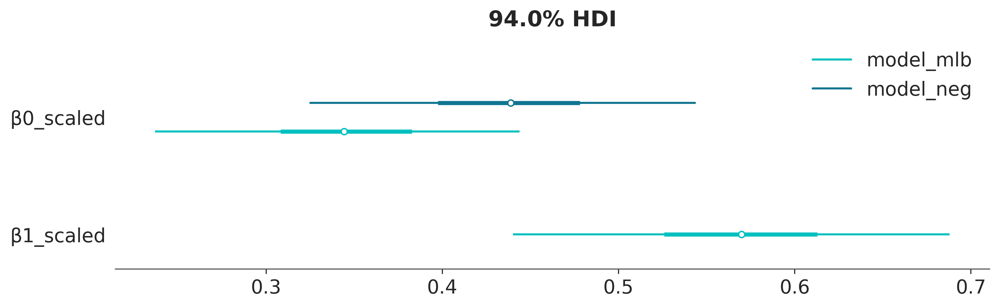

In [45]:
# Para hacer comparables los coeficientes los escalamos respecto de su correspondiente desviación estándar
idata_neg.posterior["β0_scaled"] = idata_neg.posterior["β"] * bicis.temperatura.std()

idata_mlb.posterior["β0_scaled"] = idata_mlb.posterior["β0"] * bicis.temperatura.std()
idata_mlb.posterior["β1_scaled"] = idata_mlb.posterior["β1"] * bicis.hora.std()

az.plot_forest([idata_neg, idata_mlb], model_names=["model_neg", "model_mlb"], var_names=["β0_scaled", "β1_scaled"], figsize=(10, 3), combined=True);

En la figura anterior podemos ver que el coeficiente $\beta_0$, que se corresponde con la temperatura es diferente en ambos modelos. Esto se debe a que el efecto de la hora ya explica algunas de las variaciones en el número de bicicletas alquiladas que anteriormente solo se explicaban por la temperatura. En casos extremos, la adición de una nueva variable puede llevar el coeficiente a cero o incluso cambiar el signo. Hablaremos más de esto en el próximo capítulo. 

## Bambi: una sintaxis para gobernarlos a todos

PyMC tiene una sintaxis muy simple y expresiva, que nos permite construir modelos arbitrarios, esta capacidad puede ser vista como una bendición, pero también como una carga. Bambi, en cambio, se centra en modelos de regresión; esta restricción conduce a una sintaxis más focalizada y características que serían difíciles de implementar en paquetes más generales.

Bambi utiliza una sintaxis de fórmula de Wilkinson similar a la utilizada por muchos paquetes de R como nlme, lme4 o brms. Supongamos que  tenemos un DataFrame como el siguiente:

In [46]:
SIZE = 117
datos = pd.DataFrame(
    {
        "y": np.random.normal(size=SIZE),
        "x": np.random.normal(size=SIZE),
        "z": np.random.normal(size=SIZE),
        "g": ["Group A", "Group B", "Group C"] * 39,
    }
)
datos.head()

,y,x,z,g
0,0.407373,0.926419,0.363536,Group A
1,-0.077750,-2.315925,-1.165464,Group B
2,0.459236,1.177808,0.422089,Group C
3,1.117329,1.772152,0.682265,Group A
4,-0.788372,1.089291,0.375650,Group B


Usando estos datos queremos construir un modelo lineal que prediga `y` a partir de `x`. Usando PyMC haríamos algo como:


```python
with pm.Model() as lm:
    Intercept = pm.Normal("Intercept", 0, 1)
    x = pm.Normal("x", 0, 1)
    y_sigma = pm.HalfNormal("sigma", 1)
    y_mean = Intercept + x * data["x"]
    y = pm.Normal("y", y_mean, y_sigma, observed=data["y"])
```

Usando la sintaxis de Bambi, podemos escribir el mismo modelo como:

In [47]:
un_modelo = bmb.Model("y ~ x", datos)

En el lado izquierdo de `~` tenemos la variable dependiente y en el lado derecho la(s) variable(s) independiente(s). Con esta sintaxis, solo estamos especificando la media ($\mu$ en el modelo `lm` de PyMC). De forma predeterminada, Bambi asume que el likelihood es una Normal. Esto se puede cambiar con el argumento `family`. Esta sintáxis solo especifica cómo se relacionan las variables dependientes e independiente, pero no especifica las distribuciones *a priori*. Bambi internamente define distribuciones a priori debilmente informativas. Al imprimir un modelo de Bambi obtenemos mucha información útil sobre su especificación.

In [48]:
un_modelo

       Formula: y ~ x
        Family: gaussian
          Link: mu = identity
  Observations: 117
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 0.0108, sigma: 2.6365)
            x ~ Normal(mu: 0.0, sigma: 2.4114)
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 1.0541)

La primera línea muestra la fórmula que usamos para definir el modelo y la segunda línea es el likelihood. En Bambi, usamos el argumento `family` para especificar el likelihood. La tercera línea es la función de enlace. Por defecto cada familia tiene asociada una función de enlace, por ej la Gaussiana se asocia a la función identidad. Luego tenemos el número de observaciones utilizadas para ajustar el modelo, y lo siguiente nos dice que estamos modelando linealmente el parámetro $\mu$ de la Gaussiana. Luego, en las siguientes líneas tenemos la estructura del modelo. La primera parte muestra los efectos de nivel común, en este caso, el intercepto y el coefficiente de regressión (la "pendiente") asociado a `x`. En la segunda parte se muestran los parámetros auxiliares, es decir, todos los parámetros no modelados linealmente, en este caso, la desviación estándar.


Si querés omitir el intercepto, tenés dos opciones:

In [49]:
no_intercepto_1 = bmb.Model("y ~ 0 + x", datos)
no_intercepto_1

       Formula: y ~ 0 + x
        Family: gaussian
          Link: mu = identity
  Observations: 117
        Priors: 
    target = mu
        Common-level effects
            x ~ Normal(mu: 0.0, sigma: 2.4114)
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 1.0541)

In [50]:
no_intercepto_2 = bmb.Model("y ~ -1 + x", datos)
no_intercepto_2

       Formula: y ~ -1 + x
        Family: gaussian
          Link: mu = identity
  Observations: 117
        Priors: 
    target = mu
        Common-level effects
            x ~ Normal(mu: 0.0, sigma: 2.4114)
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 1.0541)

Con Bambi también podemos incluir efectos a nivel de grupo (es decir jerarquías), por ejemplo, si queremos usar la variable `g` para agrupar parcialmente las estimaciones de `x` podemos hacerlo así:

In [51]:
modelo_h = bmb.Model("y ~ x + z + (x | g)", datos)

Para obtener una representación gráfica de la estructura de un modelo de Bambi podemos usar el método `.graph()`, esto requiere que previamente hayamos usado el método `.build()` para construir el modelo. O el método `.fit()` para ajustar el modelo (calcular la distribución posterior de los parámetros). Veamos como lucen `un_modelo` y `modelo_h`:

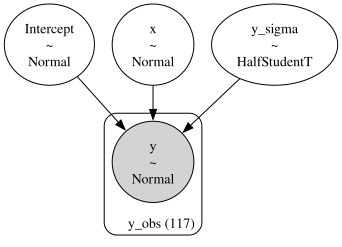

In [52]:
un_modelo.build()
un_modelo.graph()

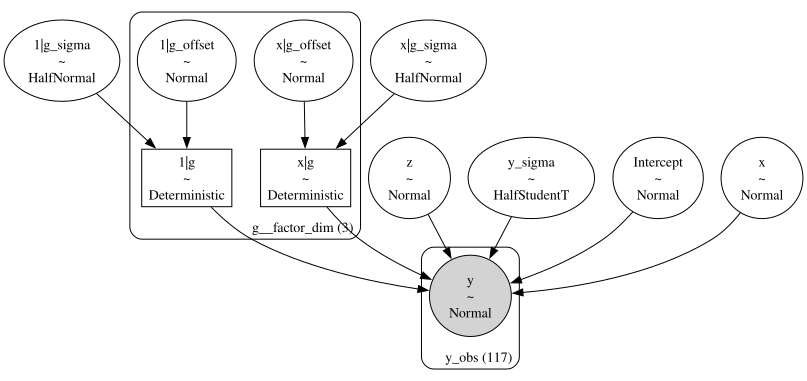

In [53]:
modelo_h.build()
modelo_h.graph()

La sintaxis de la fórmula es muy simple, pero también muy poderosa. Acabamos de arañar la superficie de lo que podemos hacer con él. En lugar de describir la sintaxis de una vez, la mostraremos mediante ejemplos. Así que comencemos ajustando el modelo de bicicleta del capítulo anterior.

## Bicicletas bambinas

In [54]:
bicis = pd.read_csv("datos/bicis.csv")

In [55]:
modelo_t = bmb.Model("alquiladas ~ temperatura", bicis, family="negativebinomial")
idata_t = modelo_t.fit()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alquiladas_alpha, Intercept, temperatura]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.


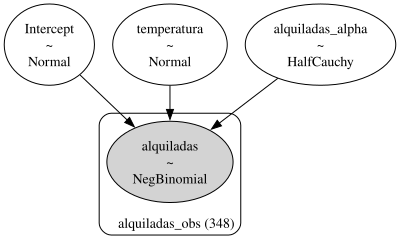

In [56]:
modelo_t.graph()

Ahora vamos a graficar el ajuste medio a posteriori y las predicciones. Para ello usaremos la función `plot_predictions` del módulo `interpret`.


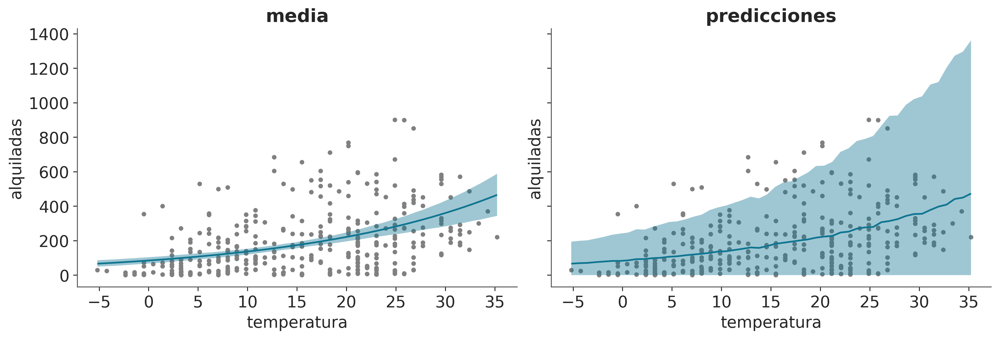

In [57]:
_, axes = plt.subplots(1, 2, sharey=True, figsize=(12, 4)) 
bmb.interpret.plot_predictions(modelo_t, idata_t, "temperatura", ax=axes[0])
bmb.interpret.plot_predictions(modelo_t, idata_t, "temperatura", pps=True, ax=axes[1])

axes[0].plot(bicis.temperatura, bicis.alquiladas, ".", color="0.5",  zorder=-3)
axes[1].plot(bicis.temperatura, bicis.alquiladas, ".", color="0.5", zorder=-3)
axes[0].set_title("media")
axes[1].set_title("predicciones");

Probemos ahora ajustar un modelo de regresión con dos variables predictoras, `temperatura` y `humedad`.

In [58]:
modelo_th = bmb.Model("alquiladas ~ temperatura + humedad", bicis, 
                     family="negativebinomial")
                     
idata_th = modelo_th.fit()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alquiladas_alpha, Intercept, temperatura, humedad]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 4 seconds.


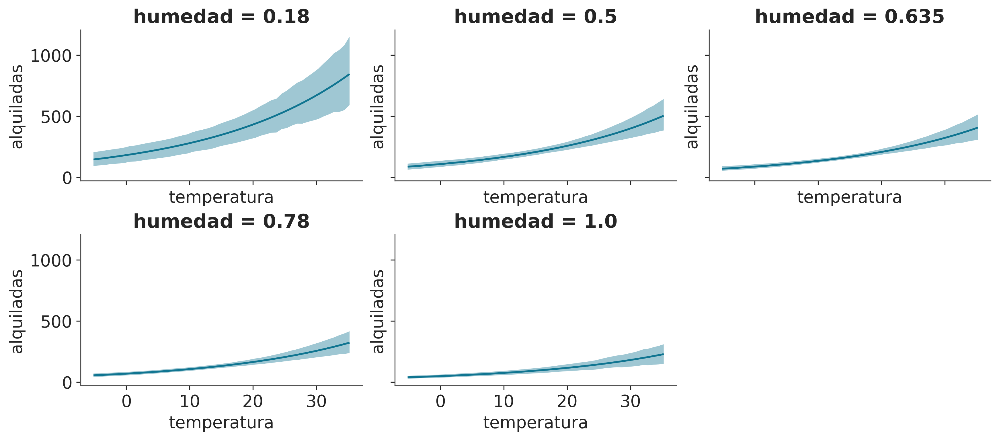

In [59]:
bmb.interpret.plot_predictions(modelo_th, idata_th, ["temperatura", "humedad"],
                               subplot_kwargs={"group":None, "panel":"humedad"},
                               legend=False,
                               fig_kwargs={"sharey":True, "sharex":True});

En la figura anterior podemos ver que la temperatura tiene un efecto positivo en el número de bicicletas alquiladas, mientras que la humedad tiene un efecto negativo. También podemos ver que el efecto de la temperatura es más fuerte que el de la humedad.

## Regresión polinomial

Una forma de ajustar curvas usando un modelo de regresión lineal es construyendo un polinomio, como este:

$$
   \mu = \beta_0 + \beta_1 x + \beta_2 x^2 + \beta_3 x^3 + \beta_4 x^4 \dots \beta_m x^m
$$

donde $m$ es el grado del polinomio.

Hay dos cosas importantes a tener en cuenta. Primero, la regresión polinómica sigue siendo una regresión lineal; la linealidad se refiere a los coeficientes (los $\beta$s), no a las variables (los $x$s). La segunda es que simplemente estamos creando nuevas variables de la nada. La única variable observada es $x$, el resto son sólo potencias de $x$. Crear nuevas variables a partir de las observadas es un "truco" perfectamente válido al hacer regresión, a veces la transformación puede estar motivada o justificada por la teoría (como sacar la raíz cuadrada de la longitud de los bebés), pero a veces es solo una forma de ajustar una curva. La intuición con los polinomios es que para un valor dado de $x$, cuanto mayor sea el grado del polinomio, más flexible será el ajuste. Un polinomio de grado 1 es una línea, un polinomio de grado 2 es una curva que puede subir o bajar, un polinomio de grado 3 es una curva que puede subir y luego bajar (o al revés), y así sucesivamente. Note que dije "puede" porque si tenemos un polinomio de grado 3 como $\beta_0 + \beta_1 x + \beta_2 x^2 + \beta_3 x^3$ pero los coeficientes $\beta_2$ y $\beta_3$ son 0 (o prácticamente 0), entonces la curva será una línea.

Hay dos formas de definir una regresión polinómica con Bambi. Podemos escribir los polinomios *brutos*:

```python
"y ~ x + I(x ** 2) + I(x ** 3) + I(x ** 4)"
```

donde usamos la función de identidad `I` para dejar claro que queremos elevar $x$ a alguna potencia. Necesitamos esto porque el operador `**` tiene un significado especial para Bambi. Si usamos esta sintaxis, le estamos diciendo a Bambi que modele la media de $y$ como $\alpha + \beta_0 x + \beta_0 x^2 + \beta_0 x^3 + \beta_0 x^4$

Alternativamente podemos escribir

```python
"y ~ poly(x, 4)"
```

Esto también generará un polinomio de grado 4, pero los términos del polinomio serán ortogonales entre sí, lo que significa que la correlación entre los términos se reduce. Sin entrar en detalles matemáticos, esto tiene al menos dos consecuencias importantes con respecto a los polinomios *brutos*. En primer lugar, la estimación puede ser numéricamente más estable y, en segundo lugar, la interpretación de los coeficientes es diferente. En la regresión polinómica *estándar*, los coeficientes pueden ser difíciles de interpretar, ya que cambiar el valor de un coeficiente afecta a todo el polinomio. En cambio, los polinomios ortogonales permiten interpretar más claramente el efecto de cada término, ya que son independientes entre sí. Si bien la interpretación de los coeficientes es diferente, otros resultados siguen siendo los mismos. Por ejemplo, deberías obtener las mismas predicciones con ambos enfoques.

Construyamos un polinomio ortogonal de grado 4 para modelar los datos de la bicis. Para este ejemplo, usaremos la variable `hora`:

In [60]:
modelo_poly4 = bmb.Model("alquiladas ~ poly(hora, degree=4)", bicis,
                       family="negativebinomial")
idata_poly4 = modelo_poly4.fit()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alquiladas_alpha, Intercept, poly(hora, degree=4)]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 4 seconds.


Text(0, 0.5, '')

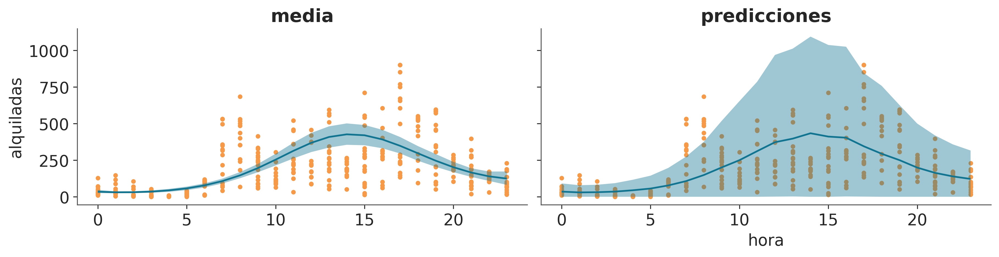

In [61]:
_, axes = plt.subplots(1, 2, sharey=True, sharex="col", figsize=(12, 3)) 
bmb.interpret.plot_predictions(modelo_poly4, idata_poly4, "hora", ax=axes[0])
bmb.interpret.plot_predictions(modelo_poly4, idata_poly4, "hora", pps=True, ax=axes[1])

for ax in axes.ravel():
    ax.plot(bicis.hora, bicis.alquiladas, "C2.", zorder=-3)
axes[0].set_title("media")
axes[1].set_title("predicciones")
axes[0].set_xlabel("")
axes[1].set_ylabel("");

Un problema con los polinomios es que actúan *globalmente*. Cuando aplicamos un polinomio de grado $m$ estamos diciendo que la relación entre las variables independientes y dependientes es de grado $m$ para todo el conjunto de datos. Esto puede resultar problemático cuando diferentes regiones de nuestros datos necesitan diferentes niveles de flexibilidad. Esto podría conducir, por ejemplo, a curvas demasiado flexibles. A medida que aumenta el grado, el ajuste se vuelve más sensible a la eliminación de puntos o, de manera equivalente, a la adición de datos futuros. En otras palabras, a medida que aumenta el grado, el modelo se vuelve más propenso a sobreajustarse. La regresión polinomial Bayesiana generalmente sufre menos de este "exceso" gracias al uso de priors y al cálculo de toda una distribución a posteriori y no una estimación puntual.

## Splines

Una forma general de escribir modelos muy flexibles es aplicar funciones $B_{m}$ a $X_{m}$ y luego multiplicarlas por coeficientes $\beta_m$:

$$
\mu = \beta_0 + \beta_1 B_{1}(X_{1}) + \beta_2 B_{2}(X_{2}) + \cdots + \beta_m B_{m}(X_{m})
$$

Somos libres de elegir las funciones $B_{m}$, por ejemplo, podemos elegir polinomios. Una opción popular es usar B-splines, no vamos a discutir su definición, pero podemos pensar en ellos como una forma de crear curvas suaves de tal manera que obtengamos flexibilidad, como con los polinomios, pero menos propensos al sobreajuste. Los B-splines son polinomios por partes, es decir, polinomios que están restringidos a afectar solo una parte de los datos. La siguiente figura muestra 3 ejemplos de polinomios por partes de grado creciente. Las líneas verticales punteadas muestran los "nudos", que son los puntos utilizados para restringir las regiones, la línea gris discontinua representa la función que queremos aproximar y las líneas negras son los polinomios por partes.


![](img/piecewise.png)


La siguiente figura muestra ejemplos de splines de grado 1 y 3, los puntos en la parte inferior representan los nudos y las líneas discontinuas son los B-splines. En la parte superior tenemos todos los B-splines con igual peso, usamos una escala de grises para resaltar que tenemos muchos B-splines. En el panel inferior, cada B-splines tiene un peso diferente (los multiplicamos por coeficientes $\beta_m$), si sumamos los B-splines ponderados obtenemos como resultado la línea negra. Esta línea negra es lo que solemos llamar "la spline". Podemos utilizar la estadística Bayesiana para encontrar los pesos adecuados para los B-splines.


![](img/splines_weighted.png)


Podemos usar B-splines con Bambi usando la función `bs`. Por ejemplo, ajustemos un spline de grado 3 a los datos de las bicis:



In [62]:
num_knots = 6
knots = np.linspace(0, 23, num_knots+2)[1:-1]
modelo_spline = bmb.Model("alquiladas ~ bs(hora, degree=3, knots=knots)", bicis,           
                         family="negativebinomial")
idata_spline = modelo_spline.fit()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alquiladas_alpha, Intercept, bs(hora, degree=3, knots=knots)]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 6 seconds.


En la siguiente figura podemos ver que el número de bicicletas de alquiler es el más bajo a altas horas de la noche. Luego se produce un aumento, probablemente cuando la gente se despierta y va al trabajo, a la escuela u otras actividades. Tenemos un primer pico alrededor de la hora 8, luego un ligero descenso, seguido por el segundo pico alrededor de la hora 18, probablemente porque la gente regresa a casa, después del cual hay un descenso constante. Observe que la curva no es muy suave, esto se debe a que los datos están discretizados (por hora).

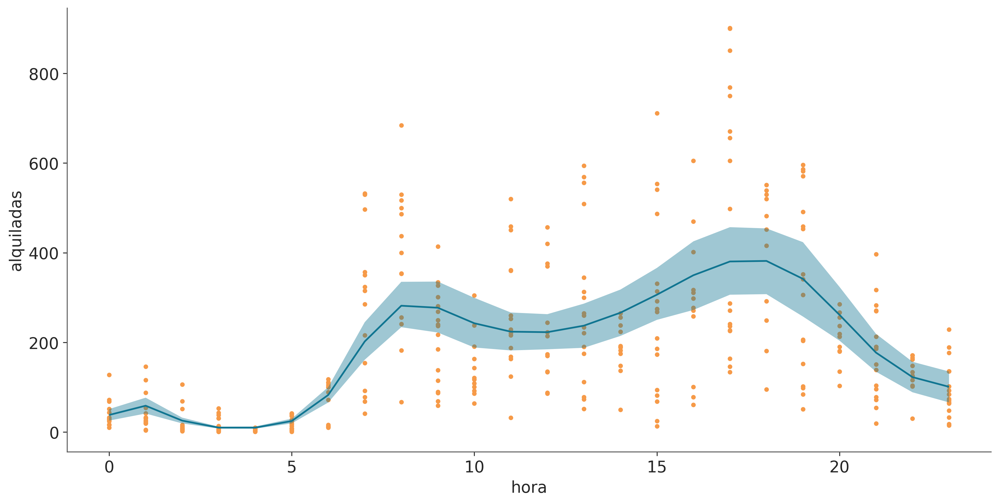

In [63]:
_, ax = plt.subplots(sharey=True, sharex="col", figsize=(12, 6)) 
bmb.interpret.plot_predictions(modelo_spline, idata_spline, "hora", ax=ax)
ax.plot(bicis.hora, bicis.alquiladas, "C2.", zorder=-3);

Cuando trabajamos con splines, una decisión importante es determinar el número y la ubicación de los nudos. Esto puede ser una tarea algo desalentadora ya que el número óptimo de nudos y su espaciado no son evidentes de inmediato. Una sugerencia útil para determinar las ubicaciones de los nudos es considerar colocarlos según cuantiles en lugar de hacerlo de manera uniforme. Por ejemplo `nudos = np.quantile(bicis.hora, np.linspace(0, 1, num_knots))`. Al hacerlo, colocaríamos más nudos en áreas donde tenemos una mayor cantidad de datos, y menos nudos en áreas con menos datos. Esto da como resultado una aproximación más adaptable que captura efectivamente la variabilidad en regiones con una mayor densidad de puntos de datos. Además, es posible que deseemos ajustar splines con distintos números de nudos y posiciones y luego evaluar los resultados, utilizando herramientas como LOO, como veremos en el próximo capítulo.

## Modelos distribucionales

Anteriormente vimos que podemos usar modelos lineales para parámetros distintos de la media. Por ejemplo, podemos utilizar un modelo lineal para la media y un modelo lineal para la desviación estándar de una distribución Gaussiana. Estos modelos suelen denominarse modelos distribucionales. La sintaxis de Bambi para los modelos distribucionales es muy similar, sólo necesitamos agregar una línea para los parámetros auxiliares que queremos modelar. Por ejemplo, sigma para una Gaussiano o alfa para un NegativaBinomial

Reproduzcamos ahora un ejemplo del capítulo anterior, el ejemplo de los bebés.

In [64]:
bebes = pd.read_csv('datos/babies.csv')

In [65]:
modelo_cons = bmb.Model("Longitud ~ np.sqrt(Meses)", bebes)
idata_cons = modelo_cons.fit()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [Longitud_sigma, Intercept, np.sqrt(Meses)]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.


En el modelo anterior sigma es constante, ahora veamos un modelo distribucional. En este modelo `sigma` es una función lineal de `Meses`.

In [66]:
formula = bmb.Formula(
    "Longitud ~ np.sqrt(Meses)",
    "sigma ~ Meses"
)
modelo_dis = bmb.Model(formula, bebes)
idata_dis = modelo_dis.fit()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [Intercept, np.sqrt(Meses), sigma_Intercept, sigma_Meses]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 4 seconds.


En la siguiente figura podemos ver los valores a posteriori de sigma para los modelos con sigma constante y variable. Podemos ver que cuando se permite que sigma varíe obtenemos valores por debajo y por encima de la estimación para un sigma constante, lo que significa que estamos subestimando y sobreestimando este parámetro cuando no permitimos que cambie.

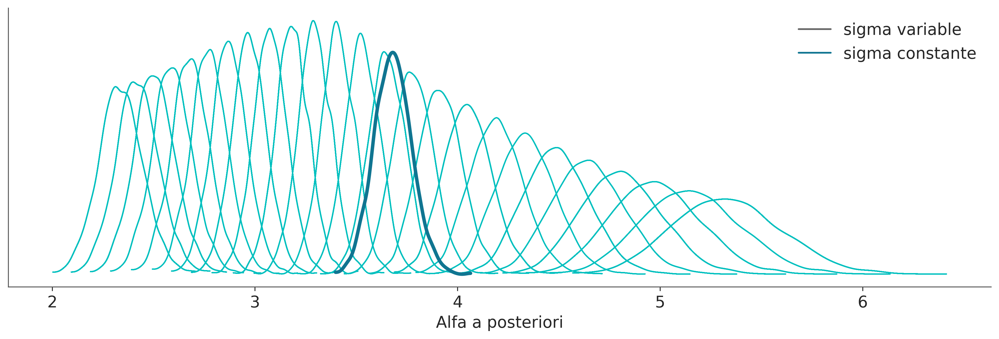

In [67]:
#| code-fold: true

fig, ax = plt.subplots(figsize=(12, 4))
from matplotlib.lines import Line2D

for idx in idata_dis.posterior.coords.get("Longitud_obs"):
    values = idata_dis.posterior["sigma"].sel(Longitud_obs=idx).to_numpy().flatten()
    grid, pdf = az.kde(values)
    ax.plot(grid, pdf, lw=1, color="C1")

values = idata_cons.posterior["Longitud_sigma"].to_numpy().flatten()
grid, pdf = az.kde(values)
ax.plot(grid, pdf, lw=3, color="C0")

handles = [
    Line2D([0], [0], label="sigma variable", lw=1.5, color="k", alpha=0.6),
    Line2D([0], [0], label="sigma constante", lw=1.5, color="C0")
]

legend = ax.legend(handles=handles, loc="upper right")

ax.set(xlabel="Alfa a posteriori", yticks=[]);

La siguiente figura muestra el ajuste a posteriori para `model_dis`. Observe que el modelo puede capturar el aumento de la variabilidad a medida que los bebés crecen. 

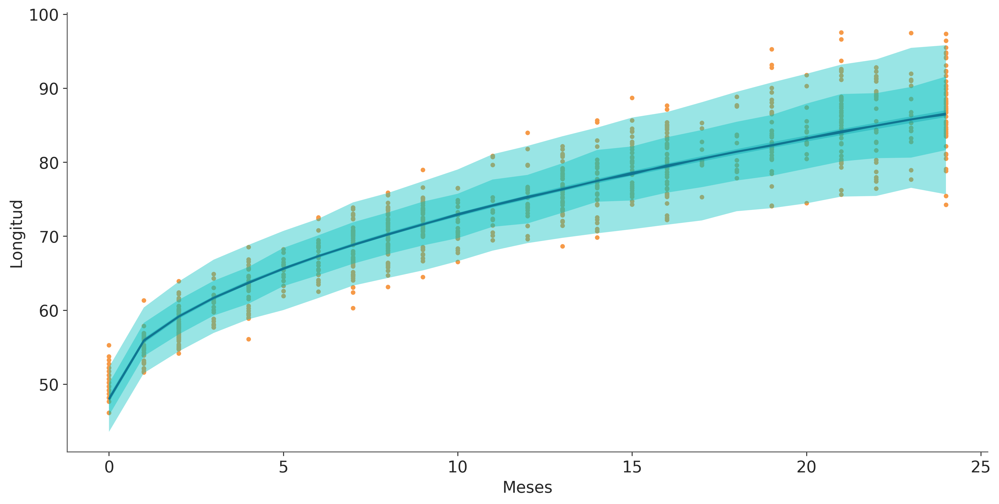

In [68]:
_, ax = plt.subplots(sharey=True, sharex="col", figsize=(12, 6)) 
bmb.interpret.plot_predictions(modelo_dis, idata_dis, "Meses", ax=ax, fig_kwargs={"color":"k"})
bmb.interpret.plot_predictions(modelo_dis, idata_dis, "Meses", pps=True, ax=ax)
ax_ = bmb.interpret.plot_predictions(modelo_dis, idata_dis, "Meses", pps=True, ax=ax, prob=0.65)
ax_[1][0].get_children()[5].set_facecolor('C1')  

ax.plot(bebes.Meses, bebes.Longitud, "C2.", zorder=-3);

Al trabajar con PyMC vimos que el muestreo de la distribución predictiva a posteriori, evaluado en valores no observados, requiere que definamos el modelo con las "X" como `Mutable_data` y luego actualicemos el valor de la variable mutable antes de calcular la distribución predictiva posterior. Con Bambi esto no es necesario, podemos usar el método `predict` para predecir nuevos valores pasando los nuevos valores al argumento `data`. Por ejemplo, predigamos la longitud de un bebé a los 0,5 meses (15 días):

In [69]:
modelo_dis.predict(idata_dis, kind="pps", data=pd.DataFrame({"Meses":[0.5]}))

Esto agrega un grupo `posterior_predictive` a `idata_dis`

In [70]:
idata_dis

Inference data with groups:
	> posterior
	> posterior_predictive
	> sample_stats
	> observed_data

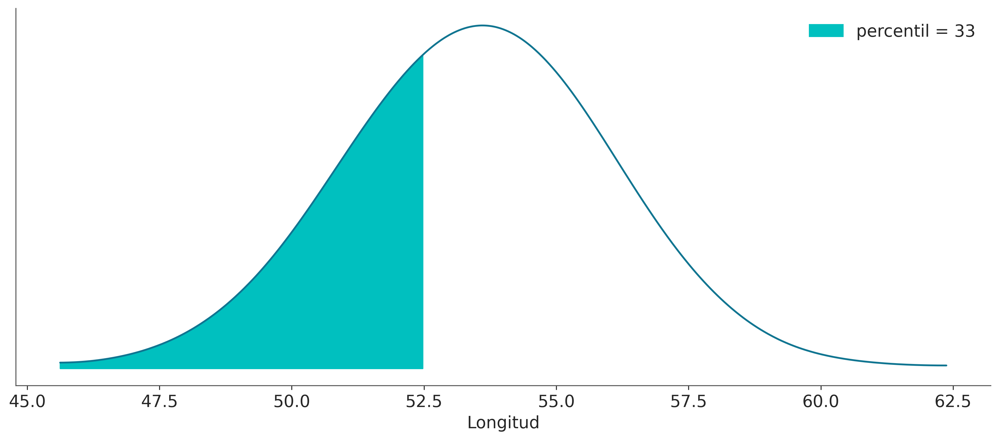

In [71]:
#| code-fold: true

ref = 52.5
y_ppc = idata_dis.posterior_predictive["Longitud"].stack(sample=("chain", "draw"))
grid, pdf = az.stats.density_utils._kde_linear(y_ppc.values)
plt.plot(grid, pdf)
percentile = int((y_ppc <= ref).mean() * 100)
plt.fill_between(
    grid[grid < ref],
    pdf[grid < ref],
    label="percentil = {:2d}".format(percentile),
    color="C1",
)
plt.xlabel("Longitud")
plt.yticks([])
plt.legend();

## Predictores Categóricos

Una variable categórica representa distintos grupos o categorías. La variable solo puede tomar un conjunto limitado de valores de esas categorías. Estos valores suelen ser etiquetas o nombres que no poseen significado numérico por sí solos. Algunos ejemplos son:

* Afiliación política: conservadora, liberal o progresista.
* Sexo: femenino o masculino.
* Nivel de satisfacción del cliente: muy insatisfecho, insatisfecho, neutral, satisfecho o muy satisfecho.


Los modelos de regresión lineal pueden acomodar fácilmente variables categóricas, solo necesitamos codificar las categorías como números. Hay algunas opciones para hacerlo. Bambi puede manejar fácilmente los detalles por nosotros. El diablo está en los detalles de como interpretamos los resultados.

### Pingüinos Categóricos

Para el ejemplo actual, vamos a utilizar el conjunto de datos de [Palmer Penguins](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0090081), que contiene 344 observaciones de 8 variables. Por el momento nos interesa modelar la masa de los pingüinos en función de la longitud de su pico. Se espera que la masa de los pingüinos aumente a medida que aumenta la longitud del pico. La novedad de este ejemplo es que vamos a considerar la variable categórica, `species`. Esta variable tiene 3 categorías o niveles, a saber, `Adelie`, `Chinstrap` y `Gentoo`. La @fig-scatter_pen muestra un diagrama de dispersión para las variables que queremos modelar.


In [3]:
#| code-fold: true

penguins = pd.read_csv("datos/penguins.csv").dropna()
penguins.head()

,species,island,bill_length,bill_depth,flipper_length,body_mass,sex,year
0,Adelie,Torgersen,3.91,1.87,18.1,3.75,male,2007
1,Adelie,Torgersen,3.95,1.74,18.6,3.80,female,2007
2,Adelie,Torgersen,4.03,1.80,19.5,3.25,female,2007
4,Adelie,Torgersen,3.67,1.93,19.3,3.45,female,2007
5,Adelie,Torgersen,3.93,2.06,19.0,3.65,male,2007


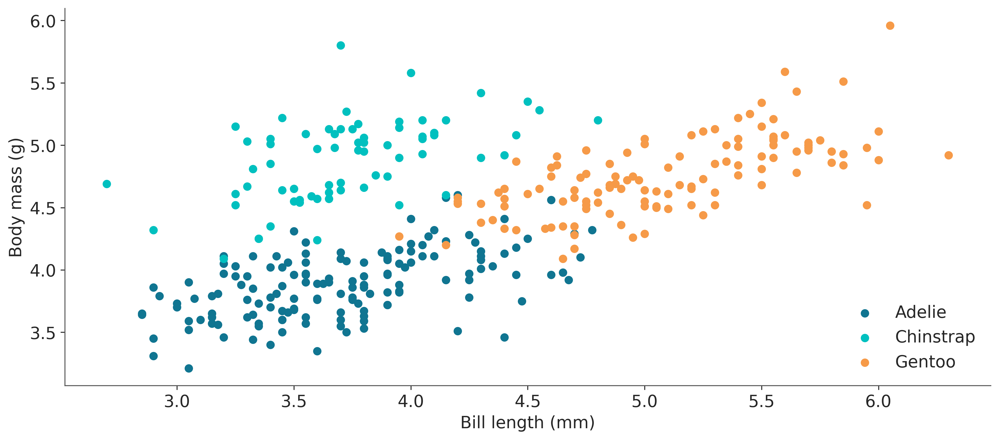

In [73]:
#| code-fold: true
#| label: fig-scatter_pen
#| fig-cap: Largo del pico (bill_length) vs masa (body_mass) para 3 especies de pingüinos.


# Get unique categories
unique_categories = np.unique(penguins.species)

# Create color map for categories
category_color_map = {cat: f"C{i}" for i, cat in enumerate(unique_categories)}

# Generate colors for each category
colors = [category_color_map[cat] for cat in penguins.species]

# Create scatter plot for each category
for cat in unique_categories:
    category_data = penguins[penguins.species == cat]
    plt.scatter(category_data.body_mass, category_data.bill_length, c=category_color_map[cat], label=cat)

# Add labels and legend
plt.ylabel("Body mass (g)")
plt.xlabel("Bill length (mm)")
plt.legend(labels=unique_categories, loc="lower right");

Para ajustar un modelo con variables categoricas no necesitamos de ninguna sintáxis especial

In [4]:
modelo_p = bmb.Model("body_mass ~ bill_length + species", data=penguins)
idata_p = modelo_p.fit()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [body_mass_sigma, Intercept, bill_length, species]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.


La @fig-penguins_posterior muestra un forest plot para `model_p`. ¿Notás algo inesperado? No hay valores posteriores para `Adelie`. Esto no es un error. De forma predeterminada, Bambi codifica variables categóricas con `N` niveles (3 especies) como `N-1` variables (2 especies). Así, los coeficientes `species-Chinstrap` y `species-Gentoo` representan deflecciones del modelo base:

$$
\text{body\_mass} = \beta_0 + \beta_1 \text{bill\_length} 
$$

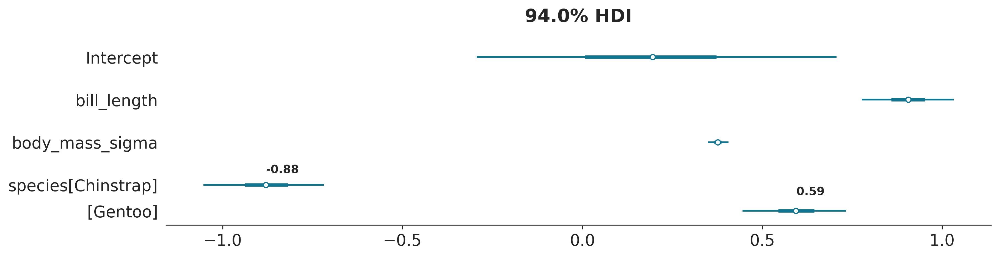

In [7]:
#| code-fold: true
#| label: fig-penguins_posterior
#| fig-cap: Fores plot para la distribución a posteriori de `modelo_p`.


ax = az.plot_forest(idata_p, combined=True, figsize=(12, 3))
mean_chinstrap = idata_p.posterior["species"].sel(species_dim="Chinstrap").mean()
mean_gentoo = idata_p.posterior["species"].sel(species_dim="Gentoo").mean()
ax[0].annotate(f"{mean_chinstrap.item():.2f}", (mean_chinstrap , 1.2), weight='bold')
ax[0].annotate(f"{mean_gentoo.item():.2f}", (mean_gentoo , 0.5), weight='bold');

Para que esto quede más claro, revisemos un par de gráficos. Podemos leer la @fig-penguins_posterior como que la masa corporal de `Chinstrap` es en promedio -0.89 respecto de la masa corporal media de `Adelie`. Lo mismo ocurre con `Gentoo`, pero esta vez tenemos que agregar 0,66 a la media del modelo base. Podés comprobar que estas dos afirmaciones son verdaderas mirando la @fig-penguins_predictions. Observá cómo las 3 líneas son esencialmente paralelas entre sí con `Adelie` en el medio, `Chinstrap` debajo (-0,89) y `Gentoo` arriba (0,58).

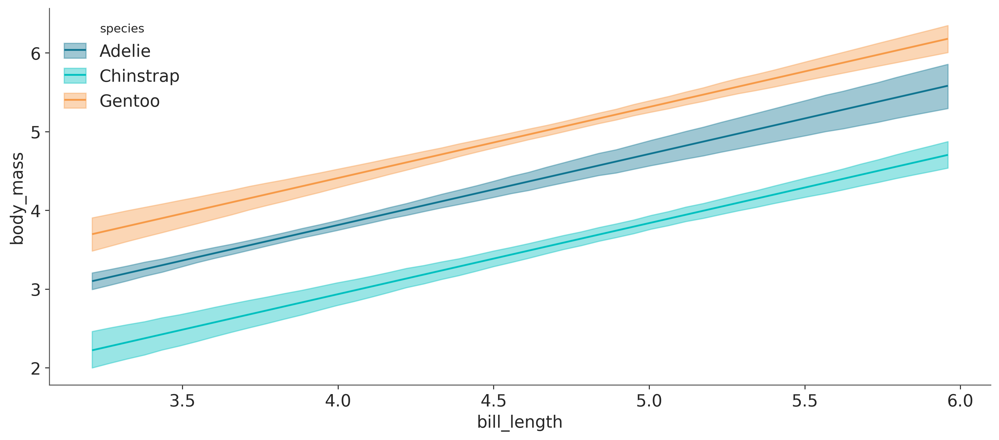

In [76]:
#| code-fold: true
#| label: fig-penguins_predictions
#| fig-cap: Predicciones del ajuste medio para `modelo_p`.


bmb.interpret.plot_predictions(modelo_p, idata_p, ["bill_length",  "species"]);

### Relación con modelos jerárquicos


En el @sec-hierarchical-models analizamos y contrastamos los modelos agrupados y jerárquicos (o parcialmente agrupados). Allí mostramos que a menudo podemos aprovechar la estructura o las jerarquías de los datos. Siguiendo la lógica de ese capítulo, se podría argumentar que `Adelie`, `Gentoo` y `Chinstrap`, aunque son especies diferentes, son todos pingüinos. Por lo tanto, modelar jerárquicamente sus masas corporales puede ser una buena idea. Entonces, ¿Cuál es la diferencia entre dicho modelo y el que utilizamos en esta sección?

El factor distintivo reside en las sutilezas de los componentes de pendiente e intersección. En el caso de `model_p` (variables categóricos), la pendiente sigue siendo la misma en las tres especies de pingüinos, mientras que los interceptos pueden variar. `Intercept + 0` para `Adelie`, `Intercept + species[Chinstrap]` para Chinstrap, y `Intercept + species[Gentoo]` para `Gentoo`. Por lo tanto, este modelo resalta los distintos incerceptos manteniendo la pendiente uniforme.

Si, en cambio, hubiéramos construido el modelo jerárquico `body_mass ~ bill_length|species)`, habríamos estado pidiendo una pendiente y un intercepto parcialmente agrupados. Y si en lugar de eso hubiéramos modelado `body_mass ~ (0 + bill_length | specie)` habríamos estado pidiendo una pendiente parcialmente agrupada y un intercepto común.

Entonces, ¿Cuál es mejor modelo? Como siempre, depende, incluso en algunos casos podría ser mejor una combinación de ambos enfoques, ya que no son ideas mutuamente excluyentes. Como ya comentamos, el *mejor* modelo es el que se alinea con los objetivos de tu análisis y proporciona información útil. A menudo es una buena idea explorar múltiples modelos, comparar su desempeño usando criterios apropiados (como los discutidos en el @sec-model_comparison y considerar las implicaciones prácticas de cada modelo  en el contexto de la investigación o proceso de toma de decisiones.

## Interacciones

Un efecto de interacción o interacción estadística, ocurre cuando el efecto de una variable independiente sobre la respuesta cambia dependiendo del valor de otra variable independiente en el mismo modelo. Una interacción puede ocurrir entre dos o más variables. Algunos ejemplos son:


* Eficacia de los medicamentos y edad: un medicamento que funciona mejor en personas mayores que en personas más jóvenes
* Nivel de educación e impacto en los ingresos: Es posible que la educación superior tenga un efecto positivo más fuerte en los ingresos de un género en comparación con el otro, lo que resulta en una interacción entre la educación y el género.
* Efectos del ejercicio y la dieta sobre la pérdida de peso: Podría ser que el efecto de la dieta sobre la pérdida de peso sea pequeño para las personas que hacen nada o poco ejercicio y muy importante para las personas que hacen ejercicio moderado.
* Temperatura y humedad para el crecimiento de los cultivos: El efecto de la temperatura y la humedad en el crecimiento de los cultivos puede depender del tipo de cultivo que se esté cultivando. Algunos cultivos podrían prosperar en condiciones cálidas y húmedas, mientras que otros podrían funcionar mejor en ambientes más fríos y menos húmedos, creando una interacción entre temperatura, humedad y tipo de cultivo.


Tenemos una interacción cuando el efecto combinado de dos o más variables actuando conjuntamente no es igual a la suma de sus efectos individuales. Si tenemos un modelo como 

$$
\mu = \alpha + \beta_0 X_0 + \beta_1 X_1
$$

no podemos modelar un interacción, ya que los efectos son aditivos. La forma más común de modelar una interacción es multiplicando 2 o más variables. Por ejemplo en un modelo como:

$$
\mu = \alpha + \overbrace{\beta_0 X_0 + \beta_1 X_1 }^{\text{término principal}} \; + \underbrace{\beta_3 X_0X_1}_{\text{término de interacción}} 
$$

Es común que al modelar una interacción se incluya también el término principal.

> Multiplicar dos variables puede verse como un truco similar al que usamos para la regresión polinómica (o cualquier transformación de una variable determinada). En lugar de multiplicar un predictor consigo mismo, multiplicamos dos predictores diferentes y obtenemos uno nuevo.


Definir una interacción es fácil; para un modelo PyMC, solo necesitamos multiplicar los dos predictores y agregar un coeficiente más al modelo. Para un modelo de Bambi es aún más fácil, usamos el operador `:`. Veamos un ejemplo de un modelo con y sin interacciones.


In [77]:
# Sin interacción
model_noint = bmb.Model("body_mass ~ bill_depth + bill_length", data=penguins)
idata_noint = model_noint.fit()

# Con interacción
model_int = bmb.Model("body_mass ~ bill_depth + bill_length + bill_depth:bill_length", data=penguins)
idata_int = model_int.fit()                

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [body_mass_sigma, Intercept, bill_depth, bill_length]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [body_mass_sigma, Intercept, bill_depth, bill_length, bill_depth:bill_length]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 14 seconds.


En la @fig-interaction_vs_noninteraction tenemos el ajuste de regresión media para `bill_depth` evaluado en 5 valores fijos de `bill_length`. A la izquierda tenemos el resultado para `model_noint` (sin interacciones) y a la derecha para `model_int` (con interacciones). Podemos ver que cuando no tenemos interacciones las rectas ajustadas para `bill_ depth` son paralelas en diferentes niveles de `bill_length`. En cambio, cuando tenemos interacciones las rectas ya no son paralelas, precisamente porque el efecto de cambiar `bill_depth` sobre cuánto cambia `body_mass` ya no es constante sino que está modulado por los valores de `bill_length`. Si generás una figura como @fig-interaction_vs_noninteraction, pero fijando `bill_depth` en vez de `bill_length` observarás un fenómeno parecido.

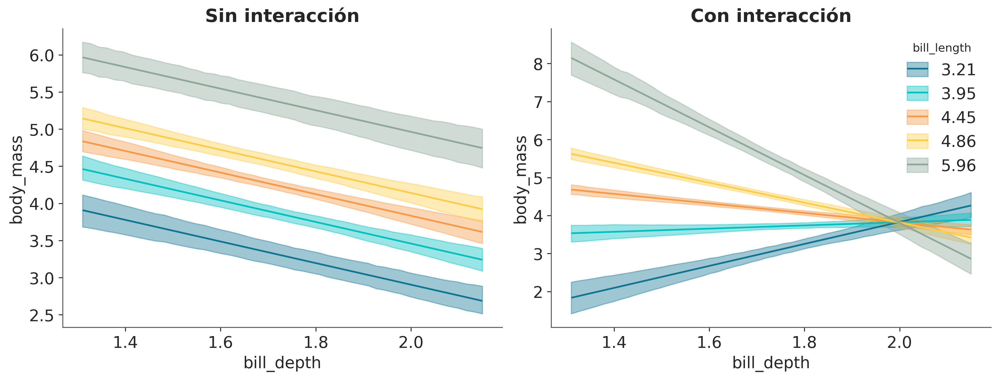

In [78]:
#| code-fold: true
#| label: fig-interaction_vs_noninteraction
#| fig-cap: Comparación de un modelo sin interacción (las lineas se mantienen paralelas) y con interacción (las lineas se cruzan).

_, axes = plt.subplots(1, 2, figsize=(12, 4.5), gridspec_kw={'hspace': 0.1})

bmb.interpret.plot_predictions(model_noint, idata_noint,
                                ["bill_depth",  "bill_length"],
                                ax=axes[0],
                                legend=False,
                                )
axes[0].set_title("Sin interacción")


bmb.interpret.plot_predictions(model_int, idata_int,
                               ["bill_depth",  "bill_length"],
                                ax=axes[1],
                                )
axes[1].set_title("Con interacción");


Acabamos de ver visualmente que interpretar modelos lineales con interacciones no es tan fácil como interpretar modelos lineales sin ellas. Veamos esto matemáticamente.

Supongamos que tenemos un modelo con 2 variables $X_0$ y $X_1$ y una interacción entre ellas:

$$
     \mu = \alpha + \beta_0 X_0 + \beta_1 X_1 + \beta_3 X_0X_1
$$

podemos reescribir este modelo como:

$$
\mu = \alpha + \underbrace{{(\beta_0 + \beta_2} X_1)}_{\text{pendiente de } X_0} X_0 + \beta_1 X_1
$$

o así:

$$
\mu = \alpha + \beta_0 X_0 + \underbrace{(\beta_1 + \beta_2 x_0)}_{\text{pendiente de } X_1} X_1
$$

A partir de esta expresión podemos ver que:

* ¡El término de interacción puede entenderse como un modelo lineal dentro de un modelo lineal!
* La interacción es simétrica; podemos pensar en ello como la pendiente de $x_0$ en función de $x_1$ y al mismo tiempo como la pendiente de $x_1$ en función de $x_0$. Esto también se puede ver en la figura interactiva.
* Sabemos desde antes que el coeficiente $\beta_0$ se puede interpretar como la cantidad de cambio de $\mu$ por unidad de cambio de $x_0$ (por eso lo llamamos pendiente). Si agregamos un término de interacción, entonces esto solo es cierto en $x_1 = 0$. Intente utilizar la figura interactiva para verlo usted mismo. Matemáticamente, esto es cierto porque cuando $x_1 = 0$ entonces $\beta_2x_1 = 0$, y por lo tanto la pendiente de $x_0$ se reduce a $\beta_0 x_0$. Por simetría, el mismo razonamiento se puede aplicar a $\beta_1$.

## Interpretando modelos con Bambi

Ya hemos usado `bmb.interpret_plot_predictions` en este capítulo. Pero esa no es la única herramienta que nos ofrece Bambi para ayudarnos a comprender los modelos. Otra opción es `bmb.interpret_plot_comparisons`. Esta herramienta nos ayuda a responder la pregunta: ¿Cuál es la diferencia predictiva esperada cuando comparamos dos valores de una variable determinada mientras mantenemos el resto en valores constantes?


Como ejemplo usemos `model_int`, que ya ajustamos en la sección anterior.

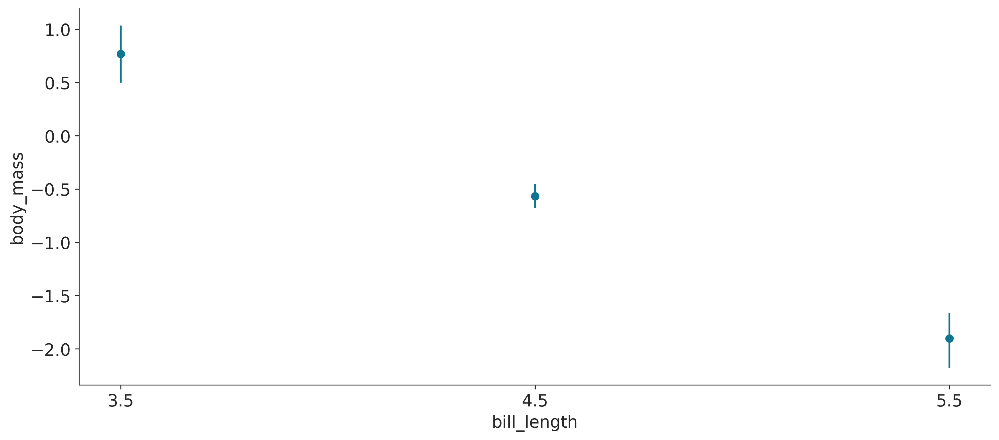

In [79]:
#| label: fig-interaction_comparisons
#| fig-cap: Contraste de para `bill_length` de 1,8 a 1,4 cm para 3 valores fijos de `bill_length`, 3.5, 4.5 y 5.5.

bmb.interpret.plot_comparisons(model_int, idata_int,
                               contrast={"bill_depth":[1.4, 1.8]},
                               conditional={"bill_length":[3.5, 4.5, 5.5]});

La figura anterior muestra que al comparar un pingüino hipotético con profundidad de pico (`bill_depth`) de 1,8 con uno con profundida de pico de 1,4, la diferencia esperada es:

* aproximadamente 0,8 kg para un pico de 3,5 de longitud
* -0,7 kg para un pico de 4,5 de largo
* aproximadamente -2 kg para un pico de 5,5 de largo


Para obtener esta misma información, pero en forma de tabla podemos usar la función `bmb.interpret.comparisons` y obtendremos un DataFrame de Pandas.

In [80]:
#| code-fold: true
bmb.interpret.comparisons(model_int, idata_int,
                          contrast={"bill_depth":[1.4, 1.8]},
                          conditional={"bill_length":[3.5, 4.5, 5.5]})

,term,estimate_type,value,bill_length,estimate,lower_3.0%,upper_97.0%
0,bill_depth,diff,"(1.4, 1.8)",3.5,0.768417,0.498433,1.035196
1,bill_depth,diff,"(1.4, 1.8)",4.5,-0.566772,-0.674116,-0.455068
2,bill_depth,diff,"(1.4, 1.8)",5.5,-1.901961,-2.178738,-1.664387


Otra función muy útil es Otra función útil es `bmb.interpret_plot_slopes`. Esta función es similar a `bmb.interpret_plot_comparison`, la "tasa de cambio instantánea" o pendiente en un valor dado.

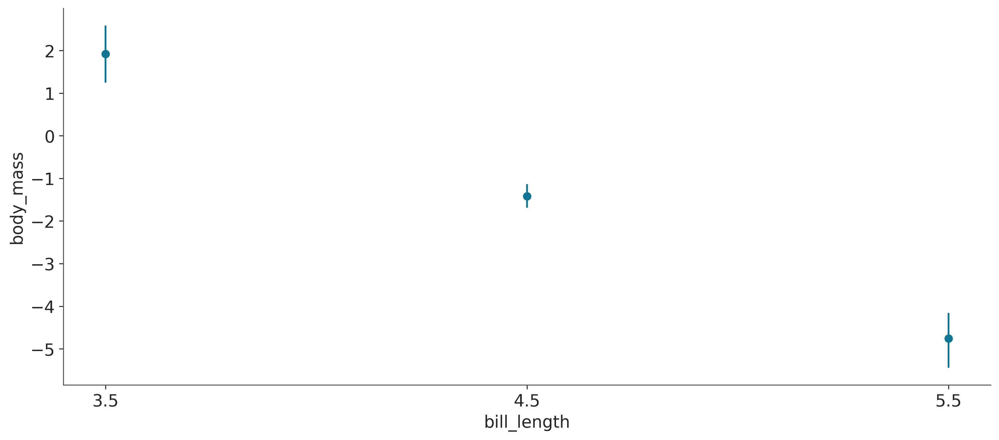

In [81]:
#| label: fig-interaction_slopes
#| fig-cap: Comparación de las pendientes de bill_depth evaluada en 1.8 para tres valores de `bill_length`, 3.5, 4.5 y 5.5.

bmb.interpret.plot_slopes(model_int, idata_int,
                          wrt={"bill_depth":1.8},
                          conditional={"bill_length":[3.5, 4.5, 5.5]});

La @fig-interaction_slopes muestra que las pendientes para `bill_depth` en 1.8 son:

* $\approx$ 2 kg/cm para un largo de pico de 3.5
* -1.4 kg/cm para un largo de pico de 4.5
* $\approx$ -5 kg/cm para un largo de pico de 5.5


Si deseas esta información en forma tabular, podés usar: la función `bmb.interpret.slopes` y obtendrás un DataFrame en lugar de un gráfico.


In [82]:
#| code-fold: true

bmb.interpret.slopes(model_int, idata_int,
                     wrt={"bill_depth":1.8},
                     conditional={"bill_length":[3.5, 4.5, 5.5]})

,term,estimate_type,value,bill_length,estimate,lower_3.0%,upper_97.0%
0,bill_depth,dydx,"(1.8, 1.8001)",3.5,1.921043,1.246082,2.587990
1,bill_depth,dydx,"(1.8, 1.8001)",4.5,-1.416930,-1.685290,-1.137671
2,bill_depth,dydx,"(1.8, 1.8001)",5.5,-4.754903,-5.446846,-4.160967



En esta sección, apenas hemos arañado la superficie de lo que podemos hacer con las herramientas del módulo `bmb.interpret`. Este módulo es una característica muy útil de Bambi, especialmente para modelos con interacciones y/o modelos con funciones de enlace distintas a la función de identidad. Les recomiendo que lea la [documentación](https://bambinos.github.io/bambi/notebooks/#tools-to-interpret-model-outputs) de Bambi para obtener más ejemplos y detalles que no se tratan aquí.

## Selección de Variables

La selección de variables se refiere al proceso de identificar las variables más relevantes en un modelo a partir de un conjunto más amplio de predictores. Realizamos la selección de variables bajo el supuesto de que sólo un subconjunto de variables tiene un impacto considerable en el resultado de interés, mientras que otras aportan poco o ningún valor adicional.

Podría decirse que "lo más bayesiano que se puede hacer" al construir un modelo es incluir todas las variables que podamos pensar en un solo modelo y luego usar la distribución a posteriori de ese modelo para hacer predicciones o comprender las relaciones de las variables. Este es el enfoque "más bayesiano" porque utilizamos la mayor cantidad de datos posible e incorporamos en la distribución a posteriori la incertidumbre sobre la importancia de las variables. Sin embargo, ser *más bayesiano que Bayes* no siempre es la mejor idea.

Realizar selección de variables es una buena idea cuando:

* Necesitamos reducir el costo de medición. Por ejemplo, en medicina, es posible que tengamos el dinero y los recursos para realizar un estudio piloto y medir 30 variables para 200 pacientes. Pero no podemos hacer lo mismo con miles de personas. O tal vez podamos colocar muchos sensores en un campo para modelar el rinde de un cultivo, pero no podemos extender eso mismo al tamaño de toda una región productiva. Reducir costos no siempre es cuestión de dinero o tiempo. Cuando se trabaja con humanos u otros animales, también es importante reducir el dolor y la incomodidad. 

* Queremos reducir el costo computacional. Esto no es un problema para modelos pequeños y simples, pero cuando tenemos muchas variables, muchos datos o ambos, el costo computacional puede ser prohibitivo.

* Buscamos una mejor comprensión de las estructuras de correlación significativas. Es decir, nos interesa entender qué variables proporcionan mejores predicciones. Es importante aclarar que no estamos hablando de causalidad. Si bien los modelos estadísticos, en particular los GLMS, pueden usarse para inferir causalidad, hacerlo requiere pasos y suposiciones adicionales. En este curso no discutimos cómo realizar inferencia causal. Para obtener una introducción muy sencilla a la inferencia causal, consulte [este vídeo](https://www.youtube.com/watch?v=gV6wzTk3o1U). O si su inteŕes es más serio, puede consultar el libro en [Causal Inference](https://mixtape.scunning.com/): The Mixtape de Scott Cunningham. También el paquete [CausalPy](https://github.com/pymc-labs/CausalPy)

* Cuando deseamos un modelo que sea más robusto a los cambios en la distribución generadora de datos, podemos ver la selección de variables como un método para hacer que el modelo sea más robusto frente a datos no representativos.


## Inferencia predictiva por proyección


Existen muchos métodos para realizar selección de variables. En esta sección, nos centraremos en uno de ellos llamado inferencia predictiva por proyección \citep{Piironen2020, mclatchie2023}. La razón principal por la que nos centramos en este método es que ha mostrado un rendimiento muy bueno en una amplia gama de problemas.

Los principales pasos de la inferencia predictiva por proyección son:

* Generar un modelo de referencia, es decir, un modelo con todas las variables que creas que pueden ser relevantes y/o pudiste medir.
* Generar un conjunto de submodelos, es decir, modelos que solo incluyen algún subconjunto de las variables presentens en el modelo de referencia.
* Eligir el modelo más pequeño que haga predicciones lo suficientemente cercanas al modelo de referencia.


Al realizar inferencia predictiva por proyección, solo necesitamos realizar la inferencia Bayesiana "tradicional" una sola vez, solo para el modelo de referencia. Para los submodelos, las distribuciones a psoteriori se obtienen por proyección. Sin entrar en detalles técnicos, la proyección consiste en encontrar los parámetros para los submodelos de tal forma que las predicciones de los submodelos sean lo más cercanas posible a las predicciones del modelo de referencia. La proyección se puede realizar de una manera computacionalmente eficiente, por lo que el costo de estimar un posterior es mucho más económico que con los métodos MCMC. Esto es relevante porque el número total de submodelos posibles explota a medida que aumentamos el número de variables en el modelo de referencia. Considere que necesitamos evaluar todas las combinaciones posibles, sin repetir variables. Por ejemplo, digamos que tenemos cuatro variables ($A$, $B$, $C$ y $D$) y necesitamos evaluar 7 modelos, a saber, $A$, $B$, $C$, $AB$, $BC$, $AC$ y el modelo de referencia $ABC$. Siete no parece mucho, pero cuando tengamos 8 variables, necesitaremos evaluar 92 modelos diferentes. Duplicamos la cantidad de variables y la cantidad de modelos aumentó más de 10 veces!

Por supuesto, hay formas de reducir el número total de submodelos a explorar. Por ejemplo, podríamos utilizar algún método económico para filtrar las variables más prometedoras y solo hacer inferencias predictivas de proyección sobre ellas. Otra alternativa se conoce como búsqueda directa; es decir, primero ajustamos tantos modelos como variables tenemos. Luego seleccionamos un modelo/variable, el que genera las predicciones más cercanas al modelo de referencia. Luego generamos todos los submodelos con 2 variables que incluyan la variable seleccionada en el paso anterior y así sucesivamente. Si hacemos este procedimiento directo para un modelo de referencia con 8 variables en lugar de 92 modelos diferentes, necesitaremos evaluar solo 36.

Otro aspecto que es relevante considerar al realizar inferencia predictiva por proyección es que solo proporcionamos a prioris para el modelo de referencia. Los submodelos no tienen priors explícitos; simplemente *heredan* los priors del modelo de referencia a través del procedimiento de proyección.

Una de las razones por las que la predicción proyectiva funciona en la práctica es gracias al uso de un modelo de referencia. Al ajustar los submodelos a las predicciones dentro de la muestra realizadas por el modelo de referencia, en lugar de los datos observados, estamos filtrando el ruido en los datos. Esto ayuda a separar las variables más relevantes de las menos relevantes.

## Selección de variables con Kulprit

Kulprit es un paquete de Python para inferencia predictiva por proyecciones. Funciona con Bambi, ya que podemos pasar un modelo de referencia creado con él y Kulprit hará todo el trabajo pesado por nosotros. 

Para ilustrar cómo usar Kulprit, usaremos el conjunto de datos de grasa corporal. Este conjunto de datos tiene medidas de 251 individuos, incluida su edad, peso, altura, circunferencia del abdomen, etc. Nuestro propósito es predecir el porcentaje de grasa corporal (según lo estimado por la variable `siri`). Dado que obtener mediciones precisas de la grasa corporal es costoso y potencialmente molesto para los pacientes, queremos reducir las mediciones manteniendo una buena precisión predictiva para `siri`. El conjunto de datos original incluye 13 variables. Para que este ejemplo sea realmente simple, he preseleccionado 6.

Lo primero que debemos hacer es definir y ajustar un modelo de Bambi, como es habitual. Tenemos que asegurarnos de incluir el argumento `idata_kwargs={'log_likelihood':True}}`. Internamente, Kulprit calcula el ELPD, usando LOO.

In [83]:
body = pd.read_csv("datos/body_fat.csv")

In [84]:
model = bmb.Model("siri ~ age + weight + height + abdomen + thigh + wrist",
                  data=body)
idata = model.fit(idata_kwargs={'log_likelihood': True})

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [siri_sigma, Intercept, age, weight, height, abdomen, thigh, wrist]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 10 seconds.


El principal punto de entrada de Kulprit es mediante la clase `ProjectionPredictive`. Una vez provista del modelo de Bambi y los datos resultantes del ajuste de ese modelo. Podemos pedirle a Kulprit que realice una búsqueda. Este paso puede demorar un rato, es la parte pesada de todo el proceso.

In [85]:
ppi = kpt.ProjectionPredictive(model, idata)
ppi.search()

Una vez finalizada la búsqueda, podemos pedirle a Kulprit que compare los submodelos en términos del ELPD. Los submodelos se mostrarán ordenados desde el ELPD más bajo hasta el más alto, como  en la siguiente figura

/home/osvaldo/anaconda3/envs/EI2/lib/python3.11/site-packages/arviz/stats/stats.py:792: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.62 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


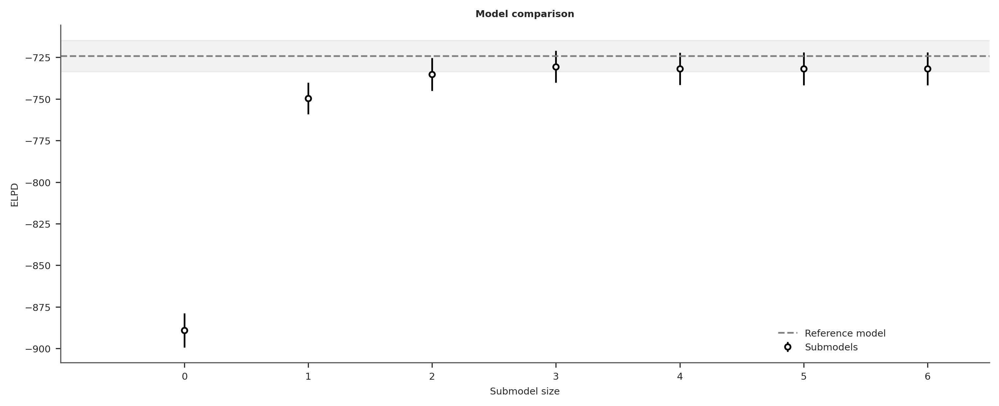

In [86]:
ppi.plot_compare(plot=True, figsize=(10, 4));

En el eje x, tenemos el tamaño del submodelo, es decir, el número de variables; Comenzamos en cero porque incluimos un modelo con solo un intercepto y sin ninguna covariables. La línea gris discontinua corresponde al ELPD del modelo de referencia.

Podemos ver que un submodelo de tamaño 3 es prácticamente equivalente al modelo de referencia. Pero ¿qué variables se incluyen exactamente en este y otros submodelos? Si imprimimos el objeto `ppi`, luego de realizar una búsqueda, obtendremos una lista ordenada de las fórmulas de los submodelos que coinciden con el orden en el gráfico obtenido con el comando  `ppi.plot_compare()`

In [87]:
ppi

  0 siri ~ 1
  1 siri ~ abdomen
  2 siri ~ abdomen + wrist
  3 siri ~ abdomen + wrist + weight
  4 siri ~ abdomen + wrist + weight + height
  5 siri ~ abdomen + wrist + weight + height + age
  6 siri ~ abdomen + wrist + weight + height + age + thigh

El modelo de tamaño 3 es el que incluye las variables `abdomen`, `wrist` y `weight`. Este resultado nos dice que si queremos elegir un modelo con menos variables que el modelo de referencia pero con una precisión predictiva similar, entonces esta es una buena opción. Dependiendo del contexto, otros submodelos también pueden ser una buena idea. Por ejemplo, podemos argumentar que la diferencia entre el submodelo de tamaños 2 y 3 es bastante pequeña. Por lo tanto, es posible que estemos dispuestos a sacrificar algo de precisión en favor de un modelo aún más pequeño. Para este ejemplo, medir la altura de los pacientes puede no ser tan problemático, pero para otros escenarios, agregar una tercera variable podría resultar costoso, molesto, peligroso, etc.

Otra forma de interpretar este resultado es notar qué los ELPD para modelos con tamaño 3 o mayor son esencialmente idénticos. Puede darse el caso de que si repetimos el análisis con un conjunto de datos ligeramente diferente, o incluso el mismo conjunto de datos pero con más muestras a posteriori, podamos obtener un orden ligeramente diferente. Por lo tanto, es posible que tengamos otros modelos de tamaño 3 con potencialmente la misma capacidad predictiva, entonces podríamos justificar la selección de la tercera variable por factores externos como qué tan fácil o barato es medirla, o cuál sería menos dolorosa de medir para los pacientes, etc. 

En resumen, como ocurre con otras herramientas estadísticas, los resultados no deben tomarse a ciegas sino en contexto; usted deben tener la última palabra y no sus herramientas. Las herramientas solo deben ayudar a fundamentar sus decisiones.

Bien, digamos que efectivamente estamos interesados en el submodelo de tamaño 3 calculado por Kulprit; podemos conseguirlo con:

In [88]:
submodelo = ppi.project(3)

Desde el objeto `submodel`, podemos recuperar información útil como el modelo de Bambi `submodelo.model` o el objeto InferenceData `submodelo.idata`.

Una advertencia al interpretar estos dos objetos: `submodelo.model` es un modelo de Bambi generado a partir de una fórmula. Así, sus priors serán los computados automáticamente por Bambi. Pero el posterior que calcula Kulprit, que está almacenado en `submodelo.idata.posterior`, no proviene directamente de este modelo. Ya que los priors son "heredados" implícitamente durante el paso de proyección.

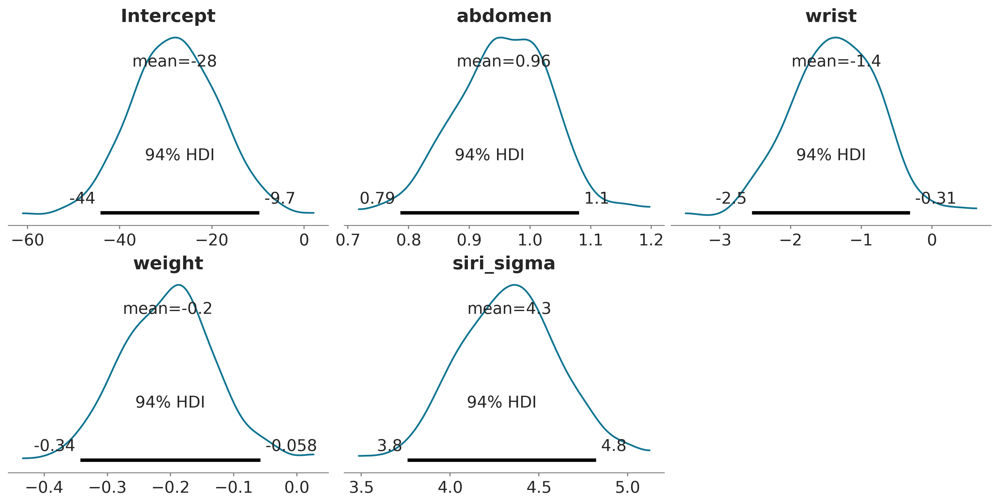

In [89]:
az.plot_posterior(submodelo.idata, figsize=(12, 6));

¿Podemos confiar en las distribuciones a posteriori proyectados? 

En condiciones muy generales, deberían ser distribuciones válidas, lo son al menos para obtener una idea aproximada de los valores de los parámetros y, por supuesto, es suficiente para la selección de variables. La falta de priors explícitos podría dificultar la interpretación del modelo, pero si solo nos importan las predicciones, eso no debería ser un problema. Por supuesto, siempre es posible usar Kulprit para determianr el submodelo y luego Bambi (o PyMC) para calcular explícitamente el posterior de ese modelo adaptado los priors de ser necesario. 

La siguiente figura muestra un forestplot para el posteriors del submodelo 3 y para el modelo de referencia. Observe que aquí hay dos posibles fuentes de diferencias: las diferencias entre MCMC y los métodos predictivos por proyección y las diferencias intrínsecas entre los posteriors para ambos modelos.

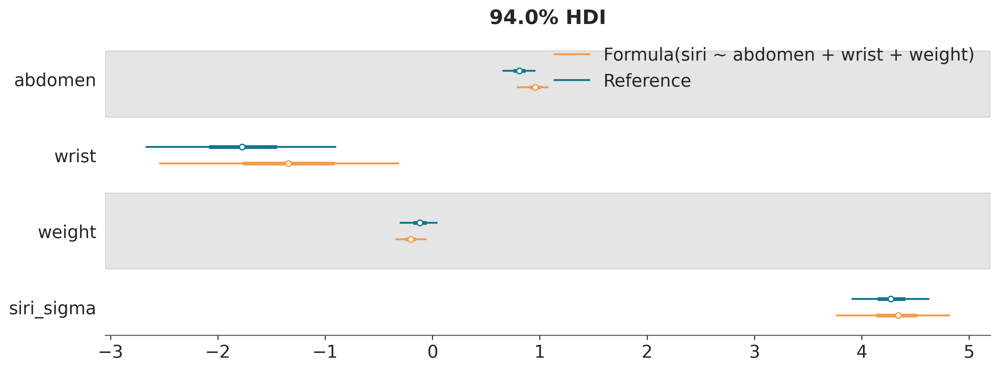

In [90]:
ppi.plot_densities(var_names=["~Intercept", "~age", "~height", "~thigh"],
                   submodels=[3],
                   kind="forest",
                   figsize=(11, 4),
                   plot_kwargs={"colors":["C0", "C2"]});

## Ejercicios

1. En la siguiente definición de modelo probabilístico cual es el _likelihood_, cual es el _a priori_ y cual el _a posteriori_.

$$
\begin{aligned}
y_i &\sim Normal(\mu, \sigma) \\
\mu &\sim Normal(0, 10) \\
\sigma &\sim HalfNormal(25)
\end{aligned}
$$

2. En el modelo del punto 1 ¿cuántos parámetros hay en el posterior? o expresado de otra forma ¿cuántas dimensiones tiene el _a posteriori_?

3. En el siguiente modelo ¿cuál es el modelo lineal? ¿cuál el likelihood y cuantos parámetros hay en la distribución a posteriori?

$$
\begin{aligned}
y &\sim Normal(\mu, \epsilon) \\
\mu &= \alpha + \beta x \\
\alpha &\sim Normal(0, 10) \\
\beta &\sim Normal(0, 1) \\
\epsilon &\sim HalfNormal(25) \\
\end{aligned}
$$


4. Usando el conjunto de datos `howell` (disponible junto con esta notebook) realice un modelo lineal del peso ($x$) versus la altura ($y$). Excluya a los menores de 18 años. Exponga los resultados.

5. Para 4 individuos se registraron los pesos (45.73, 65.8, 54.2, 32.59), pero no las alturas. Usando el modelo del punto anterior prediga la altura esperada para cada individuo junto con un intervalo de credibilidad del 50% y del 89%.

6. Repita el punto 4 pero para los menores de 18 años. Exponga los resultados.


7. Use el modelo `modelo_bl` pero aplicada al conjunto de datos iris. Intente clasificar setosa o versicolor en función de `sepal_length`. ¿Cuán útil es este modelo comparado con una regresión logística? 

8. Vuelva a correr el `modelo_rl` pero esta vez usando la variable `petal_width` ¿En que difieren los resultados? ¿Cuán ancho o angosto es el intervalo HDI 94%? 


9. Lea este [post](https://twiecki.github.io/blog/2017/02/08/bayesian-hierchical-non-centered/) y replique los resultados usted mismo.